1. **Name: Anuvarshini S P**
1. **Contact: anuvarshini027@gmail.com**
1. **Resume: [Resume](https://drive.google.com/file/d/1_o1QVh0GIIgFB5udiyrfVrlMmQIU39Qx/view?usp=sharing)**
1. **Problem Statement: To convert T1 type MRI images into T2 type MRI images.**

In [ ]:
from os import listdir
from numpy import asarray
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import savez_compressed
 

In [ ]:
# load all images in a directory into memory
def load_images(path, size=(256,256)):
    data_list = list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # store
        data_list.append(pixels)
    return asarray(data_list)

# dataset path
path1 = '../input/mri-t1-t2/Tr1/TrainT1/'
# load dataset A
dataA = load_images(path1)
print('Loaded Tr1 data: ', dataA.shape)
# load dataset B
path2='../input/mri-t1-t2/Tr2/TrainT2/'
dataB = load_images(path2)
print('Loaded Tr2 data: ', dataB.shape)
# save as compressed numpy array
filename = 'T1w2T2w_256.npz'
savez_compressed(filename, dataA, dataB)
print('Saved dataset: ', filename)

Loaded:  (43, 256, 256, 3) (46, 256, 256, 3)


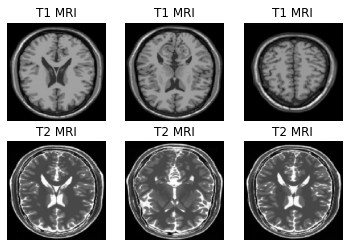

In [1]:
# load and plot the prepared dataset
from numpy import load
import matplotlib.pyplot as plt
# load the dataset
data = load('../input/output-numpy-images-256/T1w2T2w_256.npz')
dataA, dataB = data['arr_0'], data['arr_1']
print('Loaded: ', dataA.shape, dataB.shape)
# plot source images
n_samples = 3
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.title("T1 MRI")
    plt.imshow(dataA[i].astype('uint8'))
    
# plot target image
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.title("T2 MRI")
    plt.imshow(dataB[i].astype('uint8'))
plt.show()

* Having both types of MRI scans can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.</br>
* However, in practice, pathologists rarely have access to both types of MRI images for review and diagnosis purposes. This is because of a variety of reasons such as certain scan time limitations as well as other factors such as distorted contrast found in MRI images due to noise or artifacts.</br>
* One of the ways to overcome these inefficiencies is to use a type of artificial intelligence technique called style transfer to synthesize MRI images of different contrast levels from existing MRI scans.</br>
* Cycle Generative Adversarial Networks (CycleGAN) is an algorithm that can perform style transfer called to synthesize T1-weighted MRI images from T2-weighted MRI images and vice versa.</br>

**There are two main types of MRI images, T1-weighted MRI and T2-weighted MRI images. Both types of MRI contrast different regions within the body.**</br>
T1-weighted images specifically highlight fat tissue, while T2-weighted images highlight both fat and water within the body.</br>
T1-weighted → fat issue appear to be bright</br>
T2-weighted → both fat and water regions appear to be bright</br>
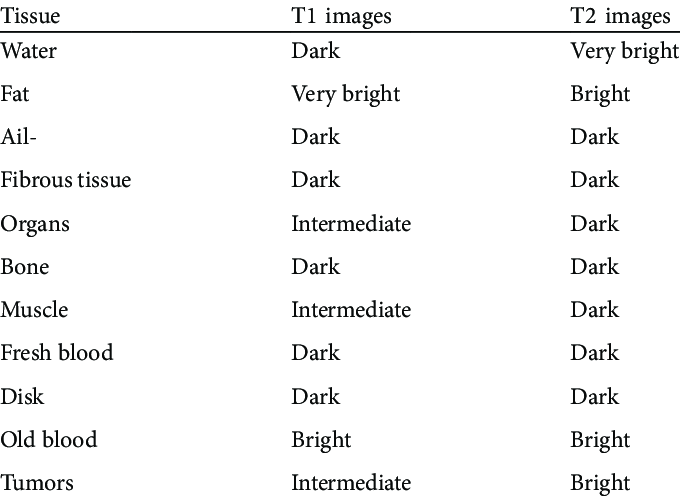

# Reference:
****The CycleGAN model was described by Jun-Yan Zhu, et al. in their 2017 paper titled “Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks.”****

# Discriminator Architecture:
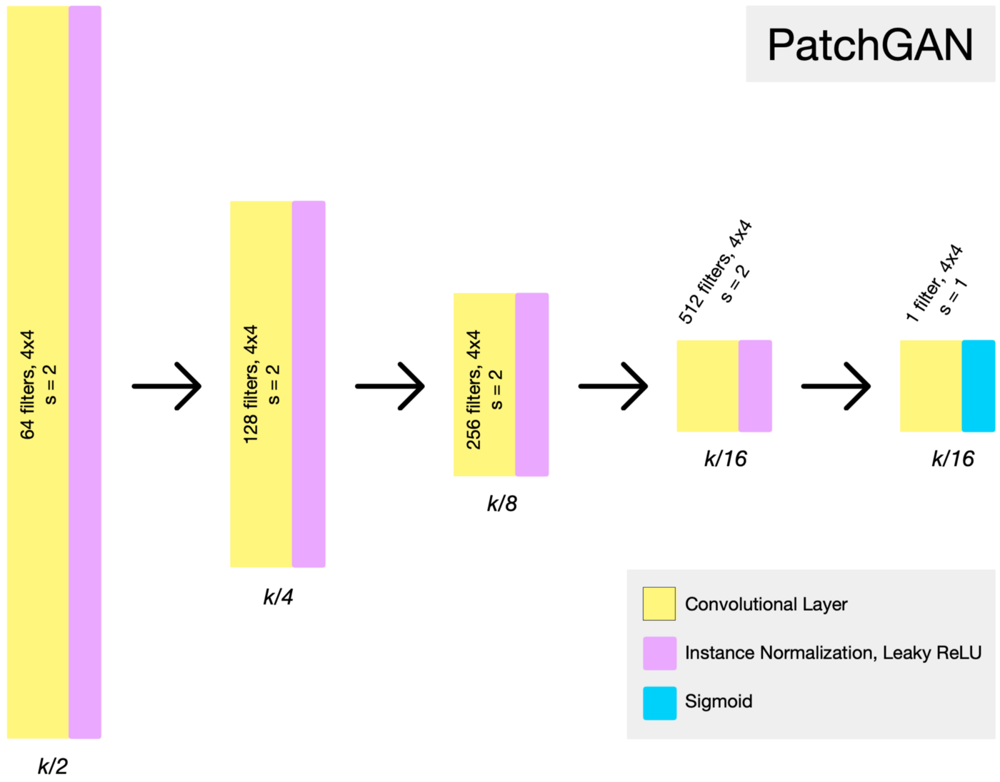

In [2]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-xowa1jc7
  Running command git clone --filter=blob:none -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-xowa1jc7
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... done
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-py3-none-any.whl size=101077 sha256=8c27cde8bc34e98cc45efad6790ff937dfbc5924c2a712a02f638809d3b01638
  Stored in directory: /tmp/pip-ephem-wheel-cache-qoe4uohh/wheels/bb/1f/f2/b57495012683b6b20bbae94a3915ec79753111452d79886abc
Successfully built keras-contrib


In [3]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# define layer
layer = InstanceNormalization(axis=-1)
#The “axis” argument is set to -1 to ensure that features are normalized per feature map.

The define_discriminator() function below implements the 70×70 PatchGAN discriminator model as per the design of the model in the paper. The model takes a 256×256 sized image as input and outputs a patch of predictions. The model is optimized using least squares loss (L2) implemented as mean squared error,and a weighting is used so that the model have half (0.5) the usual effect. The authors of CycleGAN paper recommend this weighting of model updates to slow down changes to the discriminator, relative to the generator model during training.

In [4]:
# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_image = Input(shape=image_shape)
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    # define model
    model = Model(in_image, patch_out)
    # compile model
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model

# Generator Architecture:
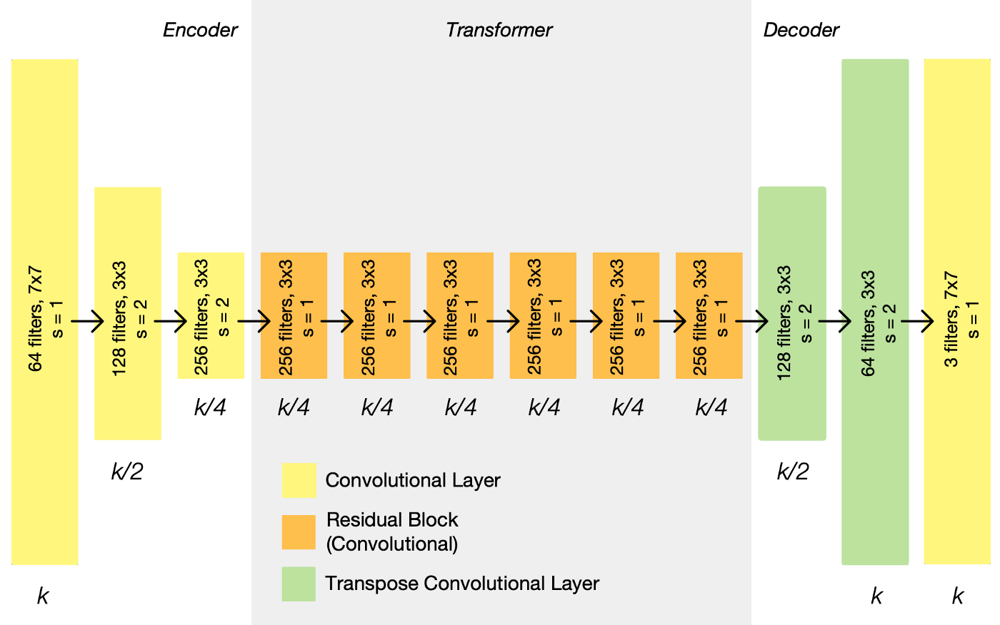

The resnet_block() function that creates two Convolution-InstanceNorm blocks with 3×3 filters and 1×1 stride and without a ReLU activation after the second block.These are blocks comprised of two 3×3 CNN layers where the input to the block is concatenated to the output of the block, channel-wise.

In [5]:
# generator a resnet block
def resnet_block(n_filters, input_layer):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # first layer convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # second convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    # concatenate merge channel-wise with input layer
    g = Concatenate()([g, input_layer])
    return g

The generator is an encoder-decoder model architecture. The model takes a source image (e.g. T1 weighted) and generates a target image (e.g. T2 weighted). First downsampling or encoding the input image down to a bottleneck layer(with reduced dimensionality), then interpreting the encoding with a number of ResNet layers that use skip connections, followed by a series of layers that upsample or decode the representation to the size of the output image.

In [6]:
# define the standalone generator model
def define_generator(image_shape, n_resnet=9):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # c64
    g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d128-downsample
    g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d256
    g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # R256-ResNet
    for _ in range(n_resnet):
        g = resnet_block(256, g)
    # u128-upsample
    g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # u64
    g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # c3
    g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

****For Generator A:(T1w to T2w)****

* Adversarial Loss: T1w -> GenA -> T2w -> DisA -> [Real,Fake] (L2 or MSE)
* Identity Loss: T2w -> GenA -> T2w (L1 or MAE)
* Forward Cycle Loss: T1w -> GenA -> T2w -> GenB -> T1w_hat (L1 or MAE)
* Backward Cycle Loss: T2w -> GenB -> T1w -> GenA -> T2w_hat (L1 or MAE)

****For Generator B: (T2w to T1w)****

* Adversarial Loss: T2w -> GenB -> T1w -> DisB -> [Real,Fake] (L2 or MSE)
* Identity Loss: T1w -> GenB -> T1w (L1 or MAE)
* Forward Cycle Loss: T2w -> GenB -> T1w -> GenA -> T2w_hat (L1 or MAE)
* Backward Cycle Loss: T1w -> GenA -> T2w -> GenB -> T1w_hat (L1 or MAE)

****define_composite_model() updates the generators based on the above losses mentioned****

In [7]:
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
    #first we train the 
    # ensure the model we're updating is trainable
    g_model_1.trainable = True
    # mark discriminator as not trainable
    d_model.trainable = False
    # mark other generator model as not trainable
    g_model_2.trainable = False
    # discriminator element
    #Input() is used to instantiate a Keras tensor.A Keras tensor is a symbolic tensor-like object, which we augment with certain attributes
    input_gen = Input(shape=image_shape) #->input 1
    gen1_out = g_model_1(input_gen) #input 1 -> g_model_1 -> gen1_out
    output_d = d_model(gen1_out) #input 1 -> g_model_1 -> gen1_out -> d_model -> [Real,Fake], here we compute L2 distance between the gen1_out and the target values of 1.0 for real and 0.0 for fake.
    # identity element
    input_id = Input(shape=image_shape) #->input 2
    output_id = g_model_1(input_id) #input 2 -> g_model_1 -> output_id
    # forward cycle
    output_f = g_model_2(gen1_out) #input 1 -> g_model_1 -> gen1_out -> g_model_2 -> output_f, here we compare the mae of input 1 and output_f
    # backward cycle
    gen2_out = g_model_2(input_id) # input 2 -> g_model_2 -> gen2_out
    output_b = g_model_1(gen2_out) # input 2 -> g_model_2 -> gen2_out -> g_model_1 -> output_b, here we compare the mae of input 2 and output_b
    # define model graph
    
    model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
    
    # define optimization algorithm configuration
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    
    # compile model with weighting of least squares loss and L1 loss
    #The cycle loss is given more weight (10-times) than the adversarial loss as described in the paper, 
    #and the identity loss is always used with a weighting half that of the cycle loss (5-times)
    model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
    return model

In [8]:
# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [9]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    #the shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16, or a 16x16x1 activation map
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return X, y

In [10]:
#The generate_fake_samples() function below generates the sample 
#given a generator model and the sample of real images from the source domain.
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, dataset, patch_shape):
    # generate fake instance
    X = g_model.predict(dataset)
    # create 'fake' class labels (0)
    #the shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16, or a 16x16x1 activation map
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [11]:
# save the generator models to file
def save_models(step, g_model_AtoB, g_model_BtoA):
    # save the first generator model
    filename1 = 'g_model_AtoB_%06d.h5' % (step+1)
    g_model_AtoB.save(filename1)
    # save the second generator model
    filename2 = 'g_model_BtoA_%06d.h5' % (step+1)
    g_model_BtoA.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

To reduce model oscillation, we follow Shrivastava et al.’s strategy and update the discriminators using a history of generated images rather than the ones produced by the latest generators. We keep an image buffer that stores the 50 previously created images.


In [12]:
# update image pool for fake images
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            # stock the pool
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            # use image, but don't add it to the pool
            selected.append(image)
        else:
            # replace an existing image and use replaced image
            ix = randint(0, len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return asarray(selected)

In [13]:
# train cyclegan models
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset):
    # define properties of the training run
    n_epochs, n_batch, = 60, 1
    # determine the output square shape of the discriminator
    n_patch = d_model_A.output_shape[1]
    # unpack dataset
    trainA, trainB = dataset #T1w and T2w
    # prepare image pool for fakes
    poolA, poolB = list(), list()
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    #bat_per_epo= 4
    n_steps = bat_per_epo * n_epochs
    # manually enumerate epochs
    for i in range(n_steps):
        # select a batch of real samples
        X_realA, y_realA = generate_real_samples(trainA, n_batch, n_patch)
        X_realB, y_realB = generate_real_samples(trainB, n_batch, n_patch)
        # generate a batch of fake samples
        X_fakeA, y_fakeA = generate_fake_samples(g_model_BtoA, X_realB, n_patch)
        X_fakeB, y_fakeB = generate_fake_samples(g_model_AtoB, X_realA, n_patch)
        # update fakes from pool
        X_fakeA = update_image_pool(poolA, X_fakeA)
        X_fakeB = update_image_pool(poolB, X_fakeB)
        # update generator B->A via adversarial and cycle loss
        g_loss2, _, _, _, _  = c_model_BtoA.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
        # update discriminator for A -> [real/fake]
        dA_loss1 = d_model_A.train_on_batch(X_realA, y_realA)
        dA_loss2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
        # update generator A->B via adversarial and cycle loss
        g_loss1, _, _, _, _ = c_model_AtoB.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
        # update discriminator for B -> [real/fake]
        dB_loss1 = d_model_B.train_on_batch(X_realB, y_realB)
        dB_loss2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)
        # summarize performance
        print('>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1,dA_loss2, dB_loss1,dB_loss2, g_loss1,g_loss2))
        if (i+1) % (bat_per_epo * 1) == 0:
            # save the models
            save_models(i, g_model_AtoB, g_model_BtoA)

In [14]:
from random import random
from numpy import load
from numpy import zeros
from numpy import ones
from numpy import asarray
from numpy.random import randint
from tensorflow.keras.optimizers import Adam 
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate

In [15]:
# load image data
dataset = load_real_samples('../input/output-numpy-images-256/T1w2T2w_256.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# generator: A -> B
g_model_AtoB = define_generator(image_shape)
# generator: B -> A
g_model_BtoA = define_generator(image_shape)
# discriminator: A -> [real/fake]
d_model_A = define_discriminator(image_shape)
# discriminator: B -> [real/fake]
d_model_B = define_discriminator(image_shape)
# composite: A -> B -> [real/fake, A]
c_model_AtoB = define_composite_model(g_model_AtoB, d_model_B, g_model_BtoA, image_shape)
# composite: B -> A -> [real/fake, B]
c_model_BtoA = define_composite_model(g_model_BtoA, d_model_A, g_model_AtoB, image_shape)
# train models
train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset)

Loaded (43, 256, 256, 3) (46, 256, 256, 3)


2022-02-17 08:09:15.748026: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-17 08:09:15.877254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-17 08:09:15.878233: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-17 08:09:15.879981: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

>1, dA[0.905,1.123] dB[0.832,1.152] g[19.550,20.319]
>2, dA[1.640,1.465] dB[5.251,1.017] g[18.857,18.888]
>3, dA[6.848,2.652] dB[2.937,0.913] g[16.884,18.002]
>4, dA[4.108,2.784] dB[1.206,1.927] g[18.229,16.472]
>5, dA[2.476,2.272] dB[0.908,1.762] g[15.944,15.367]
>6, dA[3.245,4.973] dB[0.774,4.535] g[18.820,17.542]
>7, dA[1.303,3.273] dB[0.814,4.060] g[17.102,14.463]
>8, dA[1.090,1.738] dB[1.146,1.509] g[15.037,13.618]
>9, dA[0.533,1.390] dB[0.977,1.560] g[13.895,14.473]
>10, dA[0.527,0.738] dB[0.707,1.207] g[12.630,12.435]
>11, dA[0.439,0.745] dB[0.764,0.825] g[11.590,11.580]
>12, dA[0.647,1.059] dB[0.904,0.722] g[11.762,12.227]
>13, dA[0.464,1.437] dB[1.008,0.636] g[10.860,11.351]
>14, dA[0.431,0.773] dB[0.445,0.699] g[11.738,12.071]
>15, dA[0.353,0.584] dB[0.254,0.500] g[9.792,10.537]


2022-02-17 08:10:48.590542: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>16, dA[0.256,0.408] dB[0.442,0.484] g[11.252,11.368]
>17, dA[0.257,0.474] dB[0.436,0.448] g[9.441,9.896]
>18, dA[0.296,0.451] dB[0.373,0.393] g[11.246,11.242]
>19, dA[0.207,0.349] dB[0.397,0.434] g[10.694,11.106]
>20, dA[0.304,0.440] dB[0.283,0.349] g[9.008,9.648]
>21, dA[0.178,0.716] dB[0.240,0.402] g[10.609,11.035]
>22, dA[0.289,0.675] dB[0.408,0.475] g[10.020,10.578]
>23, dA[0.301,0.473] dB[0.319,0.495] g[10.435,10.903]
>24, dA[0.425,0.370] dB[0.278,0.380] g[10.304,10.459]
>25, dA[0.290,0.394] dB[0.195,0.371] g[8.940,9.292]
>26, dA[0.223,0.370] dB[0.200,0.313] g[9.642,9.798]
>27, dA[0.419,0.391] dB[0.381,0.370] g[9.078,9.050]


2022-02-17 08:11:03.130424: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled
2022-02-17 08:11:03.703733: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>28, dA[0.198,0.349] dB[0.307,0.346] g[10.704,11.356]
>29, dA[0.230,0.341] dB[0.155,0.377] g[9.361,10.237]
>30, dA[0.206,0.363] dB[0.300,0.269] g[9.706,9.773]
>31, dA[0.135,0.226] dB[0.173,0.182] g[10.273,10.832]
>32, dA[0.236,0.269] dB[0.284,0.230] g[8.946,9.173]
>33, dA[0.146,0.264] dB[0.133,0.181] g[8.416,8.746]
>34, dA[0.157,0.304] dB[0.259,0.223] g[9.248,8.905]
>35, dA[0.155,0.238] dB[0.152,0.164] g[9.350,10.224]
>36, dA[0.102,0.180] dB[0.207,0.140] g[9.452,9.973]
>37, dA[0.104,0.172] dB[0.123,0.192] g[8.313,8.406]
>38, dA[0.099,0.187] dB[0.176,0.187] g[9.010,8.789]
>39, dA[0.219,0.230] dB[0.209,0.224] g[8.152,8.605]
>40, dA[0.079,0.146] dB[0.107,0.140] g[8.135,8.401]
>41, dA[0.101,0.149] dB[0.178,0.197] g[9.366,9.997]
>42, dA[0.091,0.151] dB[0.143,0.237] g[8.889,9.611]
>43, dA[0.119,0.181] dB[0.129,0.240] g[8.320,8.419]
>Saved: g_model_AtoB_000043.h5 and g_model_BtoA_000043.h5
>44, dA[0.090,0.247] dB[0.333,0.177] g[9.160,8.762]
>45, dA[0.147,0.163] dB[0.156,0.195] g[8.409,8.791]


2022-02-17 08:12:42.585318: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>107, dA[0.115,0.090] dB[0.128,0.049] g[7.070,7.228]
>108, dA[0.053,0.225] dB[0.063,0.105] g[7.055,7.351]
>109, dA[0.081,0.112] dB[0.114,0.064] g[7.142,7.813]
>110, dA[0.110,0.081] dB[0.171,0.377] g[7.035,7.771]
>111, dA[0.080,0.062] dB[0.251,0.100] g[8.567,8.510]
>112, dA[0.057,0.071] dB[0.096,0.319] g[7.308,7.194]
>113, dA[0.035,0.059] dB[0.082,0.169] g[6.896,6.872]
>114, dA[0.022,0.190] dB[0.253,0.067] g[9.531,9.651]
>115, dA[0.054,0.068] dB[0.084,0.330] g[7.821,8.186]
>116, dA[0.115,0.178] dB[0.069,0.060] g[8.459,9.442]
>117, dA[0.071,0.088] dB[0.122,0.137] g[7.248,6.966]
>118, dA[0.122,0.071] dB[0.225,0.188] g[7.941,7.728]
>119, dA[0.081,0.191] dB[0.088,0.066] g[8.113,8.563]
>120, dA[0.091,0.099] dB[0.077,0.172] g[7.841,8.596]
>121, dA[0.118,0.060] dB[0.079,0.068] g[7.327,8.003]
>122, dA[0.040,0.147] dB[0.063,0.077] g[9.379,9.948]
>123, dA[0.062,0.051] dB[0.067,0.062] g[8.173,8.511]
>124, dA[0.095,0.119] dB[0.066,0.175] g[7.148,8.287]
>125, dA[0.061,0.117] dB[0.127,0.081] g[8.301,

2022-02-17 08:14:14.989299: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>181, dA[0.016,0.038] dB[0.043,0.135] g[8.026,7.566]
>182, dA[0.019,0.045] dB[0.034,0.040] g[7.815,8.151]
>183, dA[0.026,0.040] dB[0.028,0.043] g[8.304,9.007]
>184, dA[0.014,0.114] dB[0.051,0.061] g[6.591,6.879]
>185, dA[0.053,0.093] dB[0.092,0.199] g[6.366,6.943]
>186, dA[0.048,0.092] dB[0.178,0.077] g[8.299,8.307]
>187, dA[0.060,0.128] dB[0.068,0.143] g[7.768,8.844]
>188, dA[0.028,0.079] dB[0.112,0.037] g[7.782,8.215]
>189, dA[0.030,0.076] dB[0.078,0.145] g[7.355,7.573]
>190, dA[0.050,0.044] dB[0.161,0.092] g[9.515,9.575]
>191, dA[0.082,0.091] dB[0.081,0.162] g[6.439,7.068]
>192, dA[0.042,0.075] dB[0.139,0.085] g[7.654,8.499]
>193, dA[0.035,0.046] dB[0.089,0.072] g[6.609,6.503]
>194, dA[0.044,0.174] dB[0.044,0.092] g[6.301,6.083]
>195, dA[0.091,0.093] dB[0.047,0.046] g[8.190,8.327]
>196, dA[0.037,0.056] dB[0.035,0.088] g[6.641,6.761]
>197, dA[0.029,0.050] dB[0.088,0.078] g[7.162,7.294]
>198, dA[0.029,0.038] dB[0.062,0.052] g[7.948,7.788]
>199, dA[0.017,0.046] dB[0.031,0.046] g[7.683,

2022-02-17 08:15:12.524306: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>227, dA[0.024,0.032] dB[0.040,0.056] g[6.684,7.246]
>228, dA[0.021,0.037] dB[0.048,0.027] g[7.878,7.909]
>229, dA[0.016,0.049] dB[0.025,0.072] g[6.441,6.711]


2022-02-17 08:15:16.198637: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>230, dA[0.018,0.046] dB[0.068,0.032] g[6.845,6.934]
>231, dA[0.013,0.048] dB[0.037,0.110] g[7.569,7.762]
>232, dA[0.021,0.076] dB[0.056,0.052] g[6.535,6.279]
>233, dA[0.042,0.027] dB[0.064,0.069] g[8.441,9.211]
>234, dA[0.040,0.094] dB[0.040,0.031] g[6.516,6.894]
>235, dA[0.034,0.075] dB[0.024,0.022] g[7.220,7.641]
>236, dA[0.041,0.055] dB[0.016,0.046] g[8.763,9.493]
>237, dA[0.017,0.048] dB[0.027,0.141] g[8.035,8.469]
>238, dA[0.034,0.035] dB[0.243,0.070] g[6.997,6.663]
>239, dA[0.032,0.032] dB[0.041,0.043] g[8.294,8.104]
>240, dA[0.012,0.047] dB[0.063,0.085] g[7.574,8.305]
>241, dA[0.011,0.074] dB[0.137,0.135] g[7.829,7.376]
>242, dA[0.035,0.024] dB[0.143,0.105] g[7.484,7.339]
>243, dA[0.028,0.045] dB[0.057,0.192] g[6.597,7.111]
>244, dA[0.020,0.048] dB[0.121,0.044] g[6.652,6.707]
>245, dA[0.019,0.039] dB[0.039,0.177] g[6.744,7.566]
>246, dA[0.031,0.056] dB[0.179,0.053] g[7.044,6.412]
>247, dA[0.051,0.023] dB[0.066,0.051] g[8.255,9.422]
>248, dA[0.010,0.058] dB[0.034,0.116] g[6.993,

2022-02-17 08:16:00.702216: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>265, dA[0.050,0.034] dB[0.041,0.026] g[6.358,6.971]
>266, dA[0.022,0.087] dB[0.054,0.127] g[6.122,6.498]
>267, dA[0.050,0.108] dB[0.126,0.040] g[8.628,8.691]
>268, dA[0.069,0.097] dB[0.021,0.068] g[7.737,8.080]
>269, dA[0.065,0.036] dB[0.066,0.050] g[6.312,6.205]
>270, dA[0.055,0.066] dB[0.024,0.042] g[7.640,7.845]
>271, dA[0.078,0.066] dB[0.022,0.031] g[7.186,8.382]
>272, dA[0.032,0.073] dB[0.015,0.021] g[5.881,6.556]
>273, dA[0.033,0.084] dB[0.054,0.129] g[7.431,8.896]
>274, dA[0.022,0.045] dB[0.206,0.038] g[7.613,7.495]
>275, dA[0.036,0.033] dB[0.090,0.146] g[5.778,6.455]
>276, dA[0.022,0.036] dB[0.133,0.071] g[6.684,6.509]
>277, dA[0.038,0.045] dB[0.039,0.245] g[6.791,7.225]
>278, dA[0.009,0.064] dB[0.132,0.072] g[7.321,7.094]
>279, dA[0.034,0.027] dB[0.043,0.047] g[7.604,7.055]
>280, dA[0.039,0.040] dB[0.050,0.119] g[6.176,6.209]
>281, dA[0.018,0.076] dB[0.052,0.026] g[8.346,8.281]
>282, dA[0.023,0.073] dB[0.098,0.185] g[6.120,6.487]
>283, dA[0.034,0.031] dB[0.039,0.041] g[6.451,

2022-02-17 08:16:33.823648: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>293, dA[0.036,0.045] dB[0.025,0.047] g[5.878,6.177]
>294, dA[0.045,0.040] dB[0.042,0.072] g[5.936,7.263]
>295, dA[0.018,0.061] dB[0.051,0.089] g[5.818,6.160]
>296, dA[0.051,0.050] dB[0.128,0.055] g[6.816,6.821]
>297, dA[0.022,0.026] dB[0.049,0.264] g[7.286,8.829]


2022-02-17 08:16:40.712225: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>298, dA[0.032,0.030] dB[0.247,0.058] g[6.728,6.579]
>299, dA[0.068,0.023] dB[0.060,0.220] g[5.765,5.856]
>300, dA[0.014,0.042] dB[0.132,0.056] g[6.422,6.176]
>301, dA[0.043,0.088] dB[0.058,0.065] g[6.513,6.331]
>Saved: g_model_AtoB_000301.h5 and g_model_BtoA_000301.h5
>302, dA[0.088,0.050] dB[0.027,0.064] g[6.374,7.145]
>303, dA[0.016,0.023] dB[0.069,0.020] g[6.259,6.477]
>304, dA[0.021,0.023] dB[0.019,0.079] g[5.510,5.674]
>305, dA[0.007,0.034] dB[0.066,0.052] g[7.587,6.995]


2022-02-17 08:16:51.745256: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>306, dA[0.026,0.027] dB[0.021,0.031] g[5.691,6.204]
>307, dA[0.007,0.026] dB[0.048,0.059] g[6.745,7.051]
>308, dA[0.022,0.043] dB[0.034,0.036] g[5.917,6.324]
>309, dA[0.029,0.128] dB[0.022,0.103] g[5.822,6.370]
>310, dA[0.066,0.021] dB[0.063,0.038] g[7.193,6.765]
>311, dA[0.076,0.048] dB[0.042,0.062] g[7.575,7.186]
>312, dA[0.079,0.073] dB[0.048,0.046] g[7.243,7.794]
>313, dA[0.020,0.029] dB[0.026,0.038] g[6.144,5.955]
>314, dA[0.030,0.059] dB[0.028,0.024] g[7.600,7.713]
>315, dA[0.093,0.061] dB[0.044,0.034] g[7.974,8.578]
>316, dA[0.016,0.037] dB[0.053,0.067] g[7.618,7.658]
>317, dA[0.014,0.020] dB[0.091,0.052] g[6.829,7.871]
>318, dA[0.017,0.076] dB[0.038,0.072] g[5.689,5.959]
>319, dA[0.025,0.021] dB[0.136,0.036] g[7.321,7.338]
>320, dA[0.049,0.062] dB[0.022,0.047] g[7.656,8.447]
>321, dA[0.035,0.114] dB[0.127,0.036] g[6.444,5.931]
>322, dA[0.013,0.050] dB[0.067,0.302] g[7.227,8.449]
>323, dA[0.011,0.109] dB[0.110,0.126] g[7.532,7.075]
>324, dA[0.033,0.058] dB[0.075,0.246] g[6.893,

2022-02-17 08:18:08.701200: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>368, dA[0.006,0.038] dB[0.097,0.029] g[6.278,6.205]
>369, dA[0.040,0.019] dB[0.070,0.036] g[5.138,6.191]
>370, dA[0.070,0.106] dB[0.058,0.047] g[7.053,6.420]
>371, dA[0.115,0.031] dB[0.016,0.145] g[6.520,7.612]
>372, dA[0.025,0.060] dB[0.235,0.028] g[5.858,5.530]
>373, dA[0.022,0.051] dB[0.030,0.074] g[5.084,5.921]
>374, dA[0.015,0.045] dB[0.063,0.036] g[6.724,7.482]
>375, dA[0.044,0.054] dB[0.048,0.121] g[5.601,6.349]
>376, dA[0.008,0.042] dB[0.139,0.077] g[8.725,9.046]
>377, dA[0.016,0.039] dB[0.018,0.089] g[7.108,7.061]
>378, dA[0.039,0.025] dB[0.064,0.053] g[6.341,6.130]
>379, dA[0.038,0.041] dB[0.029,0.245] g[5.593,5.987]
>380, dA[0.038,0.016] dB[0.062,0.045] g[7.330,6.308]
>381, dA[0.009,0.032] dB[0.069,0.299] g[6.153,5.847]
>382, dA[0.030,0.025] dB[0.078,0.130] g[6.393,6.740]
>383, dA[0.030,0.036] dB[0.048,0.050] g[6.665,6.412]
>384, dA[0.025,0.023] dB[0.093,0.076] g[5.887,6.084]
>385, dA[0.015,0.020] dB[0.019,0.032] g[6.335,6.435]
>386, dA[0.016,0.016] dB[0.108,0.034] g[7.330,

2022-02-17 08:18:45.749623: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>398, dA[0.021,0.083] dB[0.071,0.021] g[5.835,5.669]
>399, dA[0.059,0.045] dB[0.040,0.028] g[6.065,7.551]
>400, dA[0.026,0.073] dB[0.015,0.021] g[4.864,6.008]
>401, dA[0.024,0.020] dB[0.015,0.146] g[5.567,6.380]
>402, dA[0.039,0.085] dB[0.270,0.022] g[7.283,7.511]


2022-02-17 08:18:52.607038: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>403, dA[0.032,0.050] dB[0.077,0.272] g[6.094,7.209]
>404, dA[0.055,0.068] dB[0.249,0.034] g[6.254,5.843]
>405, dA[0.024,0.046] dB[0.126,0.067] g[7.951,8.850]
>406, dA[0.012,0.047] dB[0.128,0.126] g[5.131,5.846]
>407, dA[0.022,0.038] dB[0.172,0.112] g[5.678,5.760]
>408, dA[0.013,0.024] dB[0.042,0.043] g[5.668,5.791]
>409, dA[0.030,0.015] dB[0.093,0.155] g[5.383,5.355]
>410, dA[0.012,0.024] dB[0.036,0.079] g[6.584,6.194]
>411, dA[0.034,0.012] dB[0.119,0.096] g[5.414,5.640]
>412, dA[0.031,0.017] dB[0.019,0.061] g[6.289,7.020]
>413, dA[0.013,0.044] dB[0.038,0.023] g[6.729,6.096]
>414, dA[0.051,0.013] dB[0.098,0.108] g[7.572,8.175]
>415, dA[0.012,0.026] dB[0.024,0.040] g[7.746,8.190]
>416, dA[0.020,0.014] dB[0.113,0.171] g[7.464,7.620]
>417, dA[0.030,0.282] dB[0.035,0.033] g[5.737,6.081]
>418, dA[0.189,0.023] dB[0.013,0.039] g[6.487,7.448]
>419, dA[0.031,0.212] dB[0.077,0.140] g[6.920,6.998]
>420, dA[0.196,0.023] dB[0.063,0.038] g[5.912,6.547]
>421, dA[0.052,0.087] dB[0.027,0.014] g[6.636,

2022-02-17 08:19:36.512034: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>438, dA[0.039,0.158] dB[0.015,0.077] g[4.907,5.490]
>439, dA[0.057,0.052] dB[0.024,0.054] g[7.492,7.777]
>440, dA[0.040,0.150] dB[0.122,0.092] g[6.573,6.196]
>441, dA[0.124,0.064] dB[0.059,0.063] g[6.096,6.972]
>442, dA[0.191,0.041] dB[0.302,0.049] g[6.733,6.485]
>443, dA[0.116,0.153] dB[0.021,0.232] g[5.640,6.091]
>444, dA[0.177,0.128] dB[0.147,0.029] g[5.893,5.847]
>445, dA[0.078,0.070] dB[0.079,0.125] g[5.615,6.170]
>446, dA[0.143,0.271] dB[0.040,0.021] g[6.216,5.787]


2022-02-17 08:19:47.722423: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>447, dA[0.288,0.211] dB[0.063,0.021] g[5.272,6.666]
>448, dA[0.109,0.120] dB[0.039,0.031] g[6.546,7.732]
>449, dA[0.156,0.061] dB[0.094,0.163] g[5.574,6.122]
>450, dA[0.041,0.101] dB[0.153,0.067] g[6.135,5.807]
>451, dA[0.035,0.054] dB[0.102,0.068] g[5.959,6.556]
>452, dA[0.143,0.138] dB[0.070,0.044] g[6.795,7.680]
>453, dA[0.028,0.079] dB[0.072,0.018] g[7.533,7.416]
>454, dA[0.029,0.046] dB[0.028,0.035] g[6.631,7.183]
>455, dA[0.026,0.042] dB[0.012,0.040] g[6.306,7.781]
>456, dA[0.081,0.070] dB[0.022,0.074] g[5.639,6.261]
>457, dA[0.078,0.022] dB[0.034,0.030] g[5.997,5.589]
>458, dA[0.029,0.109] dB[0.045,0.079] g[6.141,5.889]
>459, dA[0.096,0.034] dB[0.032,0.039] g[5.868,5.865]
>460, dA[0.021,0.020] dB[0.031,0.043] g[7.015,6.826]
>461, dA[0.018,0.043] dB[0.021,0.024] g[6.652,6.913]
>462, dA[0.041,0.054] dB[0.034,0.024] g[5.834,6.614]
>463, dA[0.026,0.024] dB[0.020,0.053] g[4.962,5.447]
>464, dA[0.008,0.017] dB[0.228,0.020] g[6.205,5.440]
>465, dA[0.022,0.014] dB[0.172,0.381] g[4.630,

2022-02-17 08:20:24.276699: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>476, dA[0.024,0.036] dB[0.026,0.070] g[6.999,7.621]
>477, dA[0.016,0.027] dB[0.086,0.058] g[6.070,6.165]
>478, dA[0.012,0.050] dB[0.045,0.039] g[7.040,7.359]
>479, dA[0.072,0.021] dB[0.015,0.058] g[5.024,6.019]
>480, dA[0.024,0.037] dB[0.166,0.064] g[6.268,5.863]
>481, dA[0.035,0.012] dB[0.016,0.019] g[4.430,5.520]
>482, dA[0.024,0.033] dB[0.025,0.082] g[6.206,7.055]
>483, dA[0.008,0.035] dB[0.098,0.039] g[5.764,5.842]
>484, dA[0.022,0.015] dB[0.015,0.042] g[5.234,5.674]
>485, dA[0.012,0.040] dB[0.113,0.166] g[7.288,7.357]
>486, dA[0.036,0.020] dB[0.050,0.023] g[6.353,6.972]
>487, dA[0.008,0.009] dB[0.041,0.061] g[5.119,5.424]
>488, dA[0.004,0.010] dB[0.045,0.021] g[6.350,6.874]
>489, dA[0.024,0.036] dB[0.081,0.093] g[4.806,5.943]
>490, dA[0.017,0.050] dB[0.275,0.128] g[7.280,6.451]
>491, dA[0.015,0.012] dB[0.054,0.038] g[5.292,5.390]
>492, dA[0.010,0.016] dB[0.034,0.013] g[6.428,6.582]
>493, dA[0.023,0.008] dB[0.051,0.067] g[5.716,6.551]
>494, dA[0.004,0.021] dB[0.038,0.198] g[4.547,

2022-02-17 08:21:30.886452: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>530, dA[0.006,0.009] dB[0.018,0.025] g[6.225,6.985]
>531, dA[0.015,0.011] dB[0.015,0.026] g[5.534,5.959]
>532, dA[0.023,0.039] dB[0.020,0.014] g[6.873,6.936]
>533, dA[0.015,0.019] dB[0.097,0.058] g[5.231,5.779]
>534, dA[0.013,0.006] dB[0.026,0.074] g[5.092,5.964]
>535, dA[0.019,0.014] dB[0.072,0.025] g[5.758,5.681]
>536, dA[0.008,0.009] dB[0.021,0.032] g[5.753,6.334]
>537, dA[0.003,0.024] dB[0.027,0.021] g[5.676,5.715]
>538, dA[0.016,0.023] dB[0.030,0.082] g[6.278,5.655]
>539, dA[0.012,0.021] dB[0.060,0.098] g[5.716,6.393]
>540, dA[0.008,0.008] dB[0.195,0.031] g[6.899,6.528]
>541, dA[0.011,0.017] dB[0.101,0.221] g[6.275,7.450]
>542, dA[0.023,0.022] dB[0.188,0.022] g[6.571,6.704]
>543, dA[0.003,0.034] dB[0.111,0.108] g[6.828,7.132]
>544, dA[0.030,0.010] dB[0.114,0.015] g[7.257,7.620]
>545, dA[0.020,0.022] dB[0.071,0.014] g[4.392,5.326]
>546, dA[0.005,0.011] dB[0.034,0.035] g[6.386,6.400]
>547, dA[0.006,0.011] dB[0.056,0.035] g[4.926,5.556]
>548, dA[0.013,0.012] dB[0.116,0.115] g[5.007,

2022-02-17 08:24:45.858585: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>686, dA[0.034,0.022] dB[0.015,0.014] g[7.010,7.305]
>687, dA[0.012,0.027] dB[0.012,0.022] g[6.640,7.205]
>688, dA[0.012,0.008] dB[0.038,0.024] g[7.466,8.451]
>Saved: g_model_AtoB_000688.h5 and g_model_BtoA_000688.h5
>689, dA[0.010,0.012] dB[0.032,0.034] g[5.520,5.713]
>690, dA[0.004,0.007] dB[0.007,0.018] g[7.386,7.939]
>691, dA[0.003,0.008] dB[0.011,0.015] g[5.347,5.575]
>692, dA[0.012,0.007] dB[0.013,0.016] g[5.718,6.047]
>693, dA[0.004,0.030] dB[0.026,0.008] g[5.530,5.271]
>694, dA[0.009,0.012] dB[0.009,0.010] g[5.835,5.526]
>695, dA[0.005,0.008] dB[0.013,0.031] g[6.251,6.246]
>696, dA[0.002,0.011] dB[0.023,0.024] g[5.850,5.792]
>697, dA[0.004,0.009] dB[0.011,0.013] g[6.545,7.505]
>698, dA[0.004,0.008] dB[0.018,0.009] g[7.352,7.945]
>699, dA[0.005,0.010] dB[0.030,0.020] g[5.659,6.300]
>700, dA[0.012,0.007] dB[0.020,0.031] g[6.041,5.753]
>701, dA[0.002,0.006] dB[0.019,0.012] g[6.446,7.443]
>702, dA[0.003,0.008] dB[0.022,0.009] g[6.138,6.506]
>703, dA[0.005,0.019] dB[0.006,0.019] g[6

2022-02-17 08:25:51.398006: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>738, dA[0.006,0.013] dB[0.020,0.023] g[5.741,5.584]
>739, dA[0.012,0.016] dB[0.018,0.019] g[7.036,7.453]
>740, dA[0.025,0.014] dB[0.016,0.011] g[4.780,5.464]
>741, dA[0.007,0.012] dB[0.006,0.006] g[6.862,7.006]
>742, dA[0.015,0.004] dB[0.005,0.006] g[6.443,6.901]
>743, dA[0.012,0.042] dB[0.008,0.006] g[4.637,5.009]
>744, dA[0.026,0.010] dB[0.008,0.013] g[4.855,4.902]
>745, dA[0.007,0.020] dB[0.006,0.009] g[6.544,6.842]
>746, dA[0.020,0.048] dB[0.009,0.011] g[5.707,5.692]
>747, dA[0.004,0.013] dB[0.014,0.005] g[5.908,6.229]
>748, dA[0.009,0.059] dB[0.006,0.006] g[5.588,5.138]
>749, dA[0.151,0.016] dB[0.010,0.007] g[5.407,6.733]
>750, dA[0.042,0.162] dB[0.007,0.010] g[4.717,4.297]
>751, dA[0.264,0.054] dB[0.012,0.012] g[5.745,6.081]
>752, dA[0.021,0.086] dB[0.003,0.015] g[6.399,5.968]
>753, dA[0.020,0.018] dB[0.008,0.010] g[4.963,4.835]
>754, dA[0.014,0.016] dB[0.010,0.006] g[6.133,6.957]
>755, dA[0.013,0.006] dB[0.018,0.009] g[4.849,5.070]
>756, dA[0.010,0.011] dB[0.011,0.014] g[4.947,

2022-02-17 08:28:01.400742: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>842, dA[0.030,0.046] dB[0.008,0.011] g[5.439,6.574]
>843, dA[0.022,0.021] dB[0.030,0.041] g[5.132,5.221]
>844, dA[0.011,0.012] dB[0.013,0.034] g[5.744,6.558]
>845, dA[0.069,0.166] dB[0.010,0.013] g[4.254,4.485]
>846, dA[0.130,0.026] dB[0.006,0.020] g[5.027,5.294]
>847, dA[0.067,0.093] dB[0.044,0.022] g[4.544,3.977]
>848, dA[0.246,0.042] dB[0.026,0.019] g[3.994,5.310]
>849, dA[0.058,0.149] dB[0.012,0.065] g[4.075,3.839]
>850, dA[0.196,0.031] dB[0.048,0.024] g[5.066,5.599]
>851, dA[0.014,0.015] dB[0.030,0.008] g[5.336,5.949]
>852, dA[0.033,0.029] dB[0.014,0.012] g[4.580,4.444]
>853, dA[0.027,0.025] dB[0.004,0.019] g[4.680,4.776]
>854, dA[0.014,0.138] dB[0.017,0.008] g[5.073,4.492]
>855, dA[0.302,0.013] dB[0.005,0.021] g[4.606,5.606]
>856, dA[0.039,0.309] dB[0.013,0.014] g[5.543,4.404]
>857, dA[0.482,0.266] dB[0.006,0.008] g[4.696,5.439]
>858, dA[0.187,0.124] dB[0.009,0.014] g[4.905,4.777]
>859, dA[0.119,0.132] dB[0.006,0.006] g[5.604,5.141]
>860, dA[0.091,0.084] dB[0.013,0.013] g[4.590,

2022-02-17 08:31:20.873833: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1001, dA[0.024,0.020] dB[0.016,0.025] g[3.624,4.123]
>1002, dA[0.081,0.047] dB[0.168,0.296] g[5.606,5.543]
>1003, dA[0.087,0.015] dB[0.049,0.033] g[5.991,6.414]
>1004, dA[0.066,0.021] dB[0.036,0.201] g[3.630,4.229]
>1005, dA[0.067,0.059] dB[0.063,0.033] g[5.197,4.109]
>1006, dA[0.070,0.093] dB[0.016,0.024] g[6.465,7.605]
>1007, dA[0.049,0.015] dB[0.026,0.017] g[5.554,5.903]
>1008, dA[0.025,0.044] dB[0.069,0.083] g[5.241,6.270]
>1009, dA[0.026,0.054] dB[0.020,0.026] g[5.431,5.701]
>1010, dA[0.081,0.043] dB[0.074,0.173] g[5.072,5.110]
>1011, dA[0.076,0.019] dB[0.020,0.044] g[4.605,3.966]
>1012, dA[0.041,0.055] dB[0.092,0.033] g[4.084,4.008]
>1013, dA[0.011,0.057] dB[0.039,0.034] g[4.293,5.231]
>1014, dA[0.016,0.033] dB[0.096,0.020] g[5.543,5.792]
>1015, dA[0.044,0.037] dB[0.043,0.087] g[4.970,6.256]
>1016, dA[0.033,0.033] dB[0.164,0.030] g[6.630,5.621]
>1017, dA[0.010,0.008] dB[0.042,0.022] g[5.706,6.503]
>1018, dA[0.018,0.022] dB[0.080,0.120] g[4.663,5.122]
>1019, dA[0.007,0.039] dB[0.

2022-02-17 08:33:28.211329: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1103, dA[0.045,0.016] dB[0.063,0.014] g[3.469,4.829]
>1104, dA[0.013,0.045] dB[0.061,0.113] g[3.977,4.649]
>1105, dA[0.006,0.012] dB[0.401,0.312] g[5.588,4.503]
>1106, dA[0.012,0.013] dB[0.081,0.102] g[4.424,4.673]
>1107, dA[0.005,0.008] dB[0.199,0.036] g[5.088,5.005]
>1108, dA[0.005,0.007] dB[0.018,0.010] g[5.392,6.241]
>1109, dA[0.006,0.017] dB[0.009,0.041] g[4.287,4.303]
>1110, dA[0.012,0.017] dB[0.170,0.176] g[5.455,5.640]
>1111, dA[0.011,0.021] dB[0.046,0.051] g[4.714,4.856]
>1112, dA[0.048,0.021] dB[0.027,0.028] g[4.449,4.623]
>1113, dA[0.035,0.016] dB[0.026,0.028] g[3.319,4.148]
>1114, dA[0.009,0.026] dB[0.022,0.111] g[4.259,5.111]
>1115, dA[0.009,0.051] dB[0.088,0.042] g[3.978,4.125]
>1116, dA[0.010,0.006] dB[0.063,0.057] g[3.347,4.011]
>1117, dA[0.005,0.033] dB[0.163,0.025] g[4.091,3.758]
>1118, dA[0.021,0.008] dB[0.008,0.019] g[3.315,4.327]
>Saved: g_model_AtoB_001118.h5 and g_model_BtoA_001118.h5
>1119, dA[0.003,0.024] dB[0.014,0.040] g[3.742,4.333]
>1120, dA[0.017,0.006] d

2022-02-17 08:34:37.504209: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1158, dA[0.038,0.017] dB[0.062,0.017] g[5.067,4.250]
>1159, dA[0.020,0.027] dB[0.029,0.010] g[4.321,4.204]
>1160, dA[0.013,0.014] dB[0.008,0.015] g[4.927,4.539]
>1161, dA[0.043,0.427] dB[0.006,0.012] g[4.599,3.914]
>Saved: g_model_AtoB_001161.h5 and g_model_BtoA_001161.h5
>1162, dA[0.387,0.074] dB[0.006,0.009] g[4.548,4.965]
>1163, dA[0.073,0.089] dB[0.003,0.006] g[5.433,5.222]
>1164, dA[0.050,0.159] dB[0.003,0.010] g[4.534,4.135]
>1165, dA[0.126,0.059] dB[0.045,0.040] g[4.540,4.864]
>1166, dA[0.075,0.023] dB[0.006,0.006] g[5.740,6.612]
>1167, dA[0.063,0.059] dB[0.013,0.009] g[4.436,4.363]
>1168, dA[0.133,0.448] dB[0.006,0.024] g[3.802,3.609]
>1169, dA[0.184,0.041] dB[0.046,0.006] g[5.054,6.114]
>1170, dA[0.015,0.058] dB[0.027,0.030] g[4.947,4.720]
>1171, dA[0.019,0.008] dB[0.013,0.062] g[3.785,4.613]
>1172, dA[0.108,0.090] dB[0.104,0.032] g[4.376,3.904]
>1173, dA[0.058,0.016] dB[0.014,0.013] g[4.922,4.919]
>1174, dA[0.080,0.156] dB[0.022,0.019] g[3.560,3.576]
>1175, dA[0.179,0.105] d

2022-02-17 08:35:13.239300: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1186, dA[0.022,0.076] dB[0.043,0.147] g[3.855,4.074]
>1187, dA[0.020,0.025] dB[0.261,0.040] g[4.177,4.125]
>1188, dA[0.020,0.013] dB[0.049,0.110] g[3.936,4.846]
>1189, dA[0.006,0.025] dB[0.238,0.010] g[4.932,4.035]
>1190, dA[0.011,0.025] dB[0.010,0.097] g[3.051,3.330]
>1191, dA[0.008,0.010] dB[0.272,0.255] g[4.308,3.644]
>1192, dA[0.004,0.080] dB[0.078,0.026] g[4.616,4.218]
>1193, dA[0.028,0.013] dB[0.075,0.029] g[5.342,5.657]
>1194, dA[0.073,0.150] dB[0.016,0.013] g[4.124,4.480]
>1195, dA[0.012,0.070] dB[0.054,0.049] g[5.436,6.292]
>1196, dA[0.061,0.101] dB[0.052,0.046] g[4.208,4.543]
>1197, dA[0.068,0.023] dB[0.037,0.056] g[4.088,4.149]
>1198, dA[0.105,0.039] dB[0.055,0.060] g[3.957,4.229]
>1199, dA[0.030,0.015] dB[0.053,0.030] g[4.560,4.331]
>1200, dA[0.022,0.065] dB[0.055,0.023] g[3.257,3.749]
>1201, dA[0.051,0.028] dB[0.075,0.049] g[4.796,4.608]
>1202, dA[0.040,0.010] dB[0.009,0.014] g[5.791,5.739]
>1203, dA[0.008,0.104] dB[0.015,0.018] g[4.741,4.435]
>1204, dA[0.141,0.014] dB[0.

2022-02-17 08:36:37.020886: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1253, dA[0.013,0.009] dB[0.021,0.019] g[6.492,5.826]
>1254, dA[0.007,0.005] dB[0.017,0.022] g[5.741,5.372]
>1255, dA[0.016,0.010] dB[0.030,0.016] g[4.733,5.361]
>1256, dA[0.016,0.007] dB[0.016,0.009] g[4.877,4.963]
>1257, dA[0.008,0.003] dB[0.022,0.025] g[6.105,6.302]
>1258, dA[0.004,0.014] dB[0.006,0.014] g[5.150,5.823]
>1259, dA[0.004,0.007] dB[0.010,0.019] g[3.916,4.431]
>1260, dA[0.008,0.010] dB[0.028,0.008] g[5.570,6.110]
>1261, dA[0.008,0.007] dB[0.008,0.035] g[3.315,4.096]
>1262, dA[0.002,0.012] dB[0.089,0.013] g[5.391,4.796]
>1263, dA[0.003,0.015] dB[0.027,0.053] g[4.787,4.845]
>1264, dA[0.003,0.011] dB[0.017,0.022] g[3.712,3.907]
>1265, dA[0.007,0.023] dB[0.061,0.011] g[3.805,4.602]
>1266, dA[0.004,0.014] dB[0.009,0.012] g[4.756,5.355]
>1267, dA[0.006,0.018] dB[0.012,0.014] g[3.527,3.905]
>1268, dA[0.007,0.003] dB[0.013,0.068] g[3.074,3.651]
>1269, dA[0.002,0.013] dB[0.371,0.202] g[4.447,4.275]
>1270, dA[0.009,0.005] dB[0.008,0.021] g[3.730,4.628]
>1271, dA[0.004,0.006] dB[0.

2022-02-17 08:37:01.394377: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1273, dA[0.003,0.008] dB[0.020,0.023] g[5.496,5.608]
>1274, dA[0.003,0.018] dB[0.051,0.112] g[3.635,3.770]
>1275, dA[0.008,0.008] dB[0.171,0.092] g[5.169,5.431]
>1276, dA[0.006,0.012] dB[0.009,0.009] g[4.529,4.697]
>1277, dA[0.005,0.013] dB[0.088,0.312] g[3.868,3.788]
>1278, dA[0.007,0.007] dB[0.210,0.016] g[5.832,5.826]
>1279, dA[0.023,0.029] dB[0.018,0.089] g[4.037,4.606]
>1280, dA[0.012,0.008] dB[0.074,0.032] g[4.054,3.827]
>1281, dA[0.018,0.008] dB[0.013,0.017] g[3.625,3.777]
>1282, dA[0.004,0.006] dB[0.048,0.009] g[4.835,5.407]
>1283, dA[0.008,0.006] dB[0.028,0.023] g[4.736,5.061]
>1284, dA[0.004,0.011] dB[0.014,0.024] g[3.116,3.750]
>1285, dA[0.021,0.018] dB[0.037,0.007] g[4.256,4.611]
>1286, dA[0.041,0.012] dB[0.031,0.030] g[4.505,4.938]
>1287, dA[0.011,0.037] dB[0.021,0.007] g[4.448,5.215]
>1288, dA[0.069,0.006] dB[0.016,0.060] g[3.438,4.682]
>1289, dA[0.008,0.015] dB[0.124,0.030] g[4.325,3.994]
>1290, dA[0.029,0.023] dB[0.019,0.048] g[4.004,5.446]
>Saved: g_model_AtoB_001290.

2022-02-17 08:38:29.503381: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1343, dA[0.099,0.089] dB[0.107,0.053] g[5.722,4.476]
>1344, dA[0.191,0.046] dB[0.019,0.044] g[5.225,7.098]
>1345, dA[0.024,0.042] dB[0.162,0.317] g[3.634,3.615]
>1346, dA[0.009,0.023] dB[0.099,0.011] g[4.116,3.603]
>1347, dA[0.008,0.050] dB[0.006,0.024] g[4.374,5.318]
>1348, dA[0.037,0.049] dB[0.028,0.014] g[3.628,3.549]
>1349, dA[0.038,0.027] dB[0.027,0.034] g[3.081,3.893]
>1350, dA[0.006,0.026] dB[0.171,0.104] g[4.720,4.921]
>1351, dA[0.013,0.010] dB[0.013,0.011] g[4.007,4.876]
>1352, dA[0.024,0.103] dB[0.043,0.053] g[3.840,3.707]
>1353, dA[0.114,0.396] dB[0.063,0.019] g[3.692,4.682]
>1354, dA[0.130,0.048] dB[0.012,0.046] g[4.061,5.992]
>1355, dA[0.075,0.142] dB[0.197,0.193] g[4.030,3.219]
>1356, dA[0.081,0.214] dB[0.192,0.274] g[3.850,3.402]
>1357, dA[0.409,0.071] dB[0.072,0.059] g[5.242,6.170]


2022-02-17 08:38:47.844313: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1358, dA[0.029,0.055] dB[0.056,0.159] g[3.682,3.359]
>1359, dA[0.134,0.361] dB[0.152,0.123] g[3.696,3.281]
>1360, dA[0.197,0.049] dB[0.058,0.037] g[4.539,5.029]
>1361, dA[0.155,0.136] dB[0.061,0.061] g[3.715,4.844]
>1362, dA[0.108,0.239] dB[0.019,0.014] g[3.652,4.159]
>1363, dA[0.540,0.330] dB[0.022,0.019] g[3.596,4.981]
>1364, dA[0.022,0.017] dB[0.012,0.018] g[4.132,4.059]
>1365, dA[0.048,0.052] dB[0.017,0.006] g[4.618,4.047]
>1366, dA[0.008,0.023] dB[0.010,0.011] g[3.805,3.550]
>1367, dA[0.026,0.079] dB[0.006,0.086] g[3.104,3.251]
>1368, dA[0.030,0.016] dB[0.024,0.035] g[4.460,3.942]
>1369, dA[0.005,0.017] dB[0.099,0.410] g[3.482,3.424]
>1370, dA[0.022,0.074] dB[0.117,0.017] g[4.518,4.005]
>1371, dA[0.160,0.011] dB[0.014,0.080] g[3.281,4.397]
>1372, dA[0.035,0.129] dB[0.155,0.200] g[3.524,3.006]
>1373, dA[0.052,0.028] dB[0.074,0.010] g[5.750,6.358]
>1374, dA[0.020,0.019] dB[0.023,0.030] g[4.161,5.077]
>1375, dA[0.033,0.058] dB[0.025,0.020] g[3.095,3.465]
>1376, dA[0.018,0.036] dB[0.

2022-02-17 08:39:33.635058: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1395, dA[0.491,0.244] dB[0.009,0.012] g[3.304,4.108]
>1396, dA[0.060,0.222] dB[0.022,0.116] g[3.041,3.050]
>1397, dA[0.053,0.033] dB[0.287,0.141] g[3.862,3.432]
>1398, dA[0.016,0.027] dB[0.043,0.010] g[4.027,4.185]
>1399, dA[0.122,0.081] dB[0.013,0.055] g[3.009,3.755]
>1400, dA[0.011,0.005] dB[0.052,0.032] g[3.591,3.320]
>1401, dA[0.011,0.007] dB[0.004,0.032] g[4.125,4.109]
>1402, dA[0.004,0.020] dB[0.006,0.016] g[3.110,3.289]
>1403, dA[0.032,0.007] dB[0.016,0.021] g[3.860,4.163]
>1404, dA[0.024,0.013] dB[0.016,0.022] g[2.975,3.500]
>1405, dA[0.007,0.018] dB[0.025,0.085] g[3.125,2.876]
>1406, dA[0.036,0.055] dB[0.123,0.639] g[3.292,3.623]
>1407, dA[0.077,0.012] dB[0.195,0.007] g[3.524,3.925]
>1408, dA[0.068,0.019] dB[0.056,0.032] g[4.181,3.835]
>1409, dA[0.030,0.045] dB[0.010,0.176] g[2.764,3.445]
>1410, dA[0.042,0.042] dB[0.207,0.013] g[3.777,3.716]
>1411, dA[0.021,0.009] dB[0.012,0.010] g[3.817,4.428]
>1412, dA[0.018,0.011] dB[0.021,0.194] g[3.240,3.826]
>1413, dA[0.017,0.009] dB[0.

2022-02-17 08:40:39.016964: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1447, dA[0.039,0.037] dB[0.169,0.065] g[4.080,3.956]
>1448, dA[0.013,0.022] dB[0.259,0.466] g[3.817,4.698]
>1449, dA[0.013,0.010] dB[0.152,0.052] g[4.907,5.353]
>1450, dA[0.019,0.068] dB[0.133,0.071] g[3.513,3.417]
>1451, dA[0.012,0.012] dB[0.081,0.044] g[5.560,5.562]
>1452, dA[0.019,0.007] dB[0.030,0.036] g[4.176,5.222]
>1453, dA[0.091,0.048] dB[0.039,0.066] g[3.326,3.811]
>1454, dA[0.063,0.078] dB[0.042,0.152] g[3.173,2.946]
>1455, dA[0.232,0.013] dB[0.180,0.084] g[4.374,4.336]
>1456, dA[0.033,0.184] dB[0.144,0.174] g[4.548,3.690]
>1457, dA[0.240,0.055] dB[0.043,0.019] g[2.999,4.364]


2022-02-17 08:40:52.553653: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1458, dA[0.012,0.143] dB[0.094,0.090] g[3.765,3.051]
>1459, dA[0.113,0.010] dB[0.043,0.054] g[4.766,4.428]
>1460, dA[0.024,0.058] dB[0.055,0.029] g[3.177,3.639]
>1461, dA[0.025,0.023] dB[0.065,0.119] g[3.144,3.476]
>1462, dA[0.008,0.017] dB[0.038,0.006] g[3.414,3.374]
>Saved: g_model_AtoB_001462.h5 and g_model_BtoA_001462.h5
>1463, dA[0.008,0.023] dB[0.148,0.436] g[3.396,3.287]
>1464, dA[0.092,0.152] dB[0.058,0.016] g[3.530,3.963]
>1465, dA[0.196,0.133] dB[0.070,0.047] g[3.241,4.346]
>1466, dA[0.017,0.030] dB[0.045,0.016] g[5.141,6.209]
>1467, dA[0.078,0.100] dB[0.026,0.041] g[2.938,3.834]
>1468, dA[0.020,0.077] dB[0.043,0.011] g[4.561,4.727]
>1469, dA[0.051,0.016] dB[0.012,0.015] g[4.939,5.533]
>1470, dA[0.022,0.037] dB[0.011,0.023] g[4.296,5.131]
>1471, dA[0.030,0.022] dB[0.019,0.023] g[3.259,3.621]
>1472, dA[0.021,0.009] dB[0.032,0.005] g[3.244,3.277]
>1473, dA[0.005,0.019] dB[0.016,0.006] g[2.603,3.319]
>1474, dA[0.008,0.008] dB[0.005,0.080] g[4.468,5.111]
>1475, dA[0.016,0.020] d

2022-02-17 08:42:19.047940: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1527, dA[0.003,0.016] dB[0.049,0.008] g[3.049,3.214]
>1528, dA[0.013,0.006] dB[0.016,0.021] g[3.272,4.320]


2022-02-17 08:42:21.658968: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1529, dA[0.014,0.016] dB[0.010,0.024] g[3.090,3.623]
>1530, dA[0.010,0.007] dB[0.117,0.114] g[4.194,3.759]
>1531, dA[0.011,0.012] dB[0.023,0.029] g[4.906,4.946]
>1532, dA[0.004,0.006] dB[0.013,0.025] g[4.711,5.365]
>1533, dA[0.014,0.011] dB[0.021,0.060] g[3.346,4.411]
>1534, dA[0.006,0.003] dB[0.037,0.117] g[3.450,3.934]
>1535, dA[0.003,0.026] dB[0.041,0.045] g[2.934,3.056]
>1536, dA[0.053,0.007] dB[0.128,0.023] g[3.519,3.634]
>1537, dA[0.013,0.013] dB[0.016,0.010] g[2.963,3.617]
>1538, dA[0.001,0.008] dB[0.036,0.333] g[2.166,3.087]
>1539, dA[0.012,0.007] dB[0.347,0.011] g[4.195,3.407]
>1540, dA[0.016,0.004] dB[0.027,0.170] g[4.680,5.303]
>1541, dA[0.006,0.005] dB[0.045,0.034] g[3.574,3.355]
>1542, dA[0.004,0.022] dB[0.019,0.015] g[4.098,4.007]
>1543, dA[0.035,0.004] dB[0.012,0.019] g[2.904,3.830]
>1544, dA[0.008,0.014] dB[0.014,0.051] g[2.905,3.241]
>1545, dA[0.004,0.008] dB[0.064,0.009] g[3.120,3.183]
>1546, dA[0.019,0.009] dB[0.011,0.016] g[3.026,3.673]
>1547, dA[0.001,0.010] dB[0.

2022-02-17 08:42:51.449724: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1553, dA[0.013,0.004] dB[0.075,0.259] g[2.953,3.277]
>1554, dA[0.006,0.005] dB[0.069,0.009] g[4.240,4.306]
>1555, dA[0.004,0.004] dB[0.015,0.013] g[3.338,3.619]
>1556, dA[0.002,0.005] dB[0.046,0.089] g[4.439,5.118]
>1557, dA[0.002,0.007] dB[0.015,0.009] g[3.360,3.904]
>1558, dA[0.004,0.008] dB[0.053,0.006] g[4.875,5.052]
>1559, dA[0.011,0.005] dB[0.025,0.009] g[4.774,5.196]
>1560, dA[0.006,0.013] dB[0.012,0.009] g[3.885,4.378]
>1561, dA[0.004,0.019] dB[0.008,0.058] g[3.701,3.817]
>1562, dA[0.021,0.018] dB[0.038,0.012] g[3.912,3.603]
>1563, dA[0.009,0.005] dB[0.008,0.024] g[3.311,3.678]
>1564, dA[0.009,0.015] dB[0.005,0.005] g[3.013,3.450]
>1565, dA[0.012,0.009] dB[0.006,0.009] g[3.120,3.403]
>1566, dA[0.012,0.006] dB[0.017,0.003] g[3.467,3.265]
>1567, dA[0.004,0.012] dB[0.009,0.024] g[2.934,3.048]
>1568, dA[0.015,0.007] dB[0.020,0.008] g[5.297,5.526]
>1569, dA[0.007,0.007] dB[0.010,0.007] g[3.754,3.616]
>1570, dA[0.026,0.015] dB[0.058,0.225] g[4.249,4.373]
>1571, dA[0.003,0.012] dB[0.

2022-02-17 08:44:31.505103: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1633, dA[0.009,0.014] dB[0.009,0.073] g[2.646,3.308]
>1634, dA[0.013,0.013] dB[0.317,0.096] g[4.624,4.631]
>Saved: g_model_AtoB_001634.h5 and g_model_BtoA_001634.h5
>1635, dA[0.019,0.031] dB[0.081,0.025] g[2.175,3.242]
>1636, dA[0.005,0.039] dB[0.025,0.011] g[3.659,3.856]
>1637, dA[0.010,0.006] dB[0.234,0.110] g[4.288,4.384]
>1638, dA[0.006,0.007] dB[0.023,0.065] g[3.668,4.574]
>1639, dA[0.004,0.006] dB[0.076,0.026] g[4.195,4.035]
>1640, dA[0.005,0.006] dB[0.036,0.029] g[4.511,4.949]
>1641, dA[0.007,0.003] dB[0.035,0.020] g[3.633,3.632]
>1642, dA[0.006,0.015] dB[0.013,0.013] g[2.641,3.128]
>1643, dA[0.007,0.002] dB[0.031,0.034] g[2.763,3.047]
>1644, dA[0.006,0.006] dB[0.161,0.011] g[3.169,4.324]
>1645, dA[0.003,0.007] dB[0.048,0.043] g[4.113,4.634]
>1646, dA[0.014,0.018] dB[0.126,0.101] g[4.015,3.858]
>1647, dA[0.007,0.008] dB[0.058,0.031] g[3.657,4.047]
>1648, dA[0.007,0.005] dB[0.024,0.029] g[3.761,4.784]
>1649, dA[0.012,0.057] dB[0.015,0.014] g[2.230,2.981]
>1650, dA[0.005,0.010] d

2022-02-17 08:45:31.271623: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1681, dA[0.009,0.007] dB[0.008,0.016] g[4.029,4.477]
>1682, dA[0.017,0.012] dB[0.010,0.016] g[4.489,5.109]
>1683, dA[0.067,0.185] dB[0.046,0.054] g[3.714,4.161]
>1684, dA[0.047,0.127] dB[0.080,0.095] g[3.356,3.665]
>1685, dA[0.135,0.080] dB[0.010,0.038] g[4.163,4.040]
>1686, dA[0.337,0.519] dB[0.024,0.032] g[3.222,3.888]
>1687, dA[0.171,0.049] dB[0.119,0.165] g[3.759,3.815]
>1688, dA[0.197,0.137] dB[0.010,0.110] g[2.431,3.160]
>1689, dA[0.071,0.218] dB[0.257,0.019] g[4.926,3.815]
>1690, dA[0.552,0.094] dB[0.012,0.015] g[4.345,5.949]
>1691, dA[0.090,0.066] dB[0.020,0.011] g[3.351,3.446]
>1692, dA[0.016,0.057] dB[0.030,0.034] g[3.256,3.133]
>1693, dA[0.224,0.306] dB[0.146,0.137] g[3.874,4.049]
>1694, dA[0.049,0.052] dB[0.291,0.326] g[4.626,4.666]
>1695, dA[0.088,0.044] dB[0.042,0.026] g[3.297,3.842]
>1696, dA[0.065,0.043] dB[0.066,0.161] g[2.842,2.986]
>1697, dA[0.026,0.045] dB[0.075,0.019] g[3.828,3.319]
>1698, dA[0.058,0.028] dB[0.013,0.018] g[4.301,4.976]
>1699, dA[0.050,0.022] dB[0.

2022-02-17 08:49:28.180253: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1872, dA[0.008,0.002] dB[0.125,0.018] g[3.065,2.958]
>1873, dA[0.004,0.003] dB[0.053,0.125] g[3.587,4.236]
>1874, dA[0.003,0.003] dB[0.050,0.011] g[2.983,2.905]
>1875, dA[0.007,0.002] dB[0.020,0.016] g[4.476,4.309]
>1876, dA[0.002,0.008] dB[0.032,0.032] g[2.684,3.124]
>1877, dA[0.004,0.005] dB[0.054,0.021] g[3.518,4.052]
>1878, dA[0.008,0.006] dB[0.026,0.033] g[2.660,2.955]
>1879, dA[0.015,0.007] dB[0.121,0.109] g[3.886,4.136]
>1880, dA[0.005,0.002] dB[0.059,0.011] g[2.815,3.155]
>1881, dA[0.006,0.005] dB[0.019,0.130] g[2.536,3.452]
>1882, dA[0.006,0.014] dB[0.494,0.520] g[4.293,3.670]
>1883, dA[0.005,0.013] dB[0.122,0.307] g[2.761,3.809]
>1884, dA[0.040,0.017] dB[0.291,0.129] g[2.558,3.114]
>1885, dA[0.030,0.216] dB[0.148,0.027] g[3.119,2.841]
>1886, dA[0.638,0.103] dB[0.057,0.253] g[2.067,4.791]
>1887, dA[0.056,0.261] dB[0.149,0.091] g[2.207,2.548]
>1888, dA[0.274,0.017] dB[0.162,0.107] g[2.350,3.695]
>1889, dA[0.015,0.085] dB[0.067,0.093] g[2.926,3.142]
>1890, dA[0.021,0.020] dB[0.

2022-02-17 08:50:02.685974: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>1899, dA[0.071,0.025] dB[0.011,0.119] g[3.521,4.297]
>1900, dA[0.257,0.572] dB[0.431,0.090] g[3.577,3.356]
>1901, dA[0.252,0.063] dB[0.045,0.023] g[2.175,3.290]
>1902, dA[0.083,0.087] dB[0.037,0.236] g[2.858,3.855]
>1903, dA[0.021,0.013] dB[0.175,0.015] g[3.845,3.624]
>1904, dA[0.012,0.035] dB[0.013,0.078] g[3.075,3.214]
>1905, dA[0.024,0.029] dB[0.240,0.041] g[2.902,2.755]
>1906, dA[0.026,0.004] dB[0.033,0.160] g[2.276,3.477]
>1907, dA[0.012,0.033] dB[0.260,0.115] g[2.987,2.836]
>1908, dA[0.070,0.060] dB[0.076,0.008] g[5.391,4.468]
>1909, dA[0.156,0.184] dB[0.031,0.186] g[2.356,3.531]
>1910, dA[0.081,0.035] dB[0.197,0.009] g[3.967,3.985]
>1911, dA[0.015,0.085] dB[0.014,0.320] g[2.465,3.512]
>1912, dA[0.063,0.032] dB[0.347,0.024] g[3.677,3.338]
>1913, dA[0.007,0.006] dB[0.030,0.271] g[2.965,4.283]
>1914, dA[0.004,0.012] dB[0.100,0.025] g[4.449,4.485]
>1915, dA[0.012,0.011] dB[0.076,0.145] g[3.641,4.233]
>1916, dA[0.015,0.007] dB[0.024,0.011] g[4.004,4.368]
>1917, dA[0.007,0.018] dB[0.

2022-02-17 08:53:31.683849: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2066, dA[0.002,0.013] dB[0.133,0.265] g[2.899,3.773]
>2067, dA[0.010,0.006] dB[0.238,0.069] g[2.949,3.549]
>2068, dA[0.003,0.015] dB[0.094,0.117] g[2.339,2.676]
>2069, dA[0.010,0.003] dB[0.017,0.008] g[3.039,3.556]
>2070, dA[0.007,0.003] dB[0.018,0.007] g[3.078,3.135]
>2071, dA[0.004,0.010] dB[0.105,0.300] g[3.134,3.980]
>2072, dA[0.009,0.031] dB[0.145,0.008] g[2.502,2.590]
>2073, dA[0.005,0.019] dB[0.009,0.036] g[4.038,4.650]
>2074, dA[0.004,0.006] dB[0.013,0.035] g[2.225,2.862]
>2075, dA[0.019,0.002] dB[0.083,0.032] g[2.592,2.741]
>2076, dA[0.007,0.004] dB[0.010,0.126] g[1.953,2.856]
>2077, dA[0.001,0.004] dB[0.399,0.013] g[3.221,3.163]
>2078, dA[0.004,0.003] dB[0.011,0.185] g[2.851,4.061]
>2079, dA[0.005,0.005] dB[0.139,0.052] g[2.473,2.850]
>2080, dA[0.002,0.006] dB[0.126,0.177] g[4.622,4.544]
>2081, dA[0.004,0.004] dB[0.067,0.028] g[2.504,2.665]
>2082, dA[0.003,0.005] dB[0.007,0.024] g[2.784,3.257]
>2083, dA[0.008,0.002] dB[0.016,0.030] g[3.080,3.432]
>2084, dA[0.003,0.009] dB[0.

2022-02-17 08:54:26.778769: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2110, dA[0.006,0.005] dB[0.037,0.135] g[1.898,2.974]
>2111, dA[0.009,0.005] dB[0.093,0.076] g[3.087,3.393]
>2112, dA[0.003,0.004] dB[0.129,0.194] g[2.587,2.781]
>2113, dA[0.004,0.002] dB[0.106,0.055] g[2.851,3.064]
>2114, dA[0.002,0.006] dB[0.052,0.016] g[2.411,2.679]
>2115, dA[0.007,0.009] dB[0.006,0.018] g[2.260,2.720]
>2116, dA[0.030,0.010] dB[0.033,0.151] g[2.203,3.030]
>2117, dA[0.002,0.011] dB[0.470,0.168] g[2.639,2.780]
>2118, dA[0.013,0.004] dB[0.025,0.016] g[4.082,4.111]
>2119, dA[0.011,0.012] dB[0.014,0.007] g[3.922,4.347]
>2120, dA[0.006,0.006] dB[0.187,0.152] g[3.537,4.160]
>2121, dA[0.018,0.007] dB[0.032,0.010] g[2.736,3.273]
>2122, dA[0.003,0.013] dB[0.090,0.036] g[3.491,3.296]
>2123, dA[0.014,0.005] dB[0.038,0.031] g[2.507,2.927]
>2124, dA[0.019,0.014] dB[0.012,0.007] g[2.609,3.389]
>2125, dA[0.004,0.016] dB[0.037,0.101] g[2.765,3.241]
>2126, dA[0.010,0.005] dB[0.017,0.006] g[2.660,3.073]
>2127, dA[0.015,0.003] dB[0.021,0.015] g[3.210,3.351]
>2128, dA[0.006,0.012] dB[0.

2022-02-17 08:55:54.754444: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2180, dA[0.093,0.009] dB[0.033,0.025] g[4.279,3.325]
>2181, dA[0.007,0.099] dB[0.007,0.165] g[3.734,3.875]
>2182, dA[0.068,0.018] dB[0.062,0.041] g[5.066,5.609]
>2183, dA[0.040,0.256] dB[0.127,0.038] g[3.438,3.452]
>2184, dA[0.725,0.126] dB[0.100,0.032] g[2.507,4.106]
>2185, dA[0.053,0.165] dB[0.061,0.021] g[3.467,4.021]
>2186, dA[0.099,0.206] dB[0.032,0.144] g[2.379,2.619]
>2187, dA[0.124,0.054] dB[0.123,0.124] g[2.515,2.527]
>2188, dA[0.036,0.127] dB[0.110,0.092] g[2.712,2.283]
>2189, dA[0.073,0.101] dB[0.103,0.011] g[3.436,2.780]
>2190, dA[0.186,0.169] dB[0.014,0.228] g[1.714,2.698]
>2191, dA[0.065,0.103] dB[0.266,0.023] g[3.169,2.398]
>2192, dA[0.169,0.073] dB[0.009,0.100] g[2.855,3.163]
>2193, dA[0.008,0.013] dB[0.230,0.036] g[4.226,3.668]
>Saved: g_model_AtoB_002193.h5 and g_model_BtoA_002193.h5
>2194, dA[0.034,0.052] dB[0.006,0.019] g[4.623,4.532]
>2195, dA[0.116,0.282] dB[0.032,0.020] g[4.494,4.330]
>2196, dA[0.094,0.043] dB[0.015,0.048] g[3.574,4.631]
>2197, dA[0.027,0.023] d

2022-02-17 08:56:39.492878: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2215, dA[0.041,0.025] dB[0.015,0.040] g[5.407,6.393]


2022-02-17 08:56:40.252680: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2216, dA[0.016,0.023] dB[0.019,0.064] g[5.033,5.159]
>2217, dA[0.079,0.023] dB[0.161,0.031] g[4.869,4.621]
>2218, dA[0.020,0.034] dB[0.013,0.019] g[4.269,5.714]
>2219, dA[0.009,0.023] dB[0.028,0.034] g[3.601,3.651]
>2220, dA[0.013,0.010] dB[0.039,0.014] g[3.854,3.619]
>2221, dA[0.031,0.015] dB[0.007,0.013] g[3.075,3.705]
>2222, dA[0.013,0.020] dB[0.014,0.083] g[3.214,3.571]
>2223, dA[0.014,0.010] dB[0.038,0.031] g[4.507,4.605]
>2224, dA[0.010,0.016] dB[0.009,0.013] g[3.320,3.676]
>2225, dA[0.027,0.010] dB[0.006,0.006] g[3.116,3.034]
>2226, dA[0.025,0.009] dB[0.023,0.118] g[4.532,5.353]
>2227, dA[0.015,0.014] dB[0.130,0.016] g[5.066,4.928]
>2228, dA[0.008,0.020] dB[0.014,0.046] g[3.347,4.101]
>2229, dA[0.006,0.017] dB[0.018,0.016] g[4.398,4.724]
>2230, dA[0.028,0.013] dB[0.013,0.012] g[3.747,3.860]
>2231, dA[0.014,0.010] dB[0.020,0.010] g[3.929,4.373]
>2232, dA[0.061,0.171] dB[0.018,0.014] g[3.404,4.077]
>2233, dA[0.039,0.022] dB[0.026,0.010] g[4.821,5.335]
>2234, dA[0.020,0.025] dB[0.

2022-02-17 08:57:47.636961: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2269, dA[0.007,0.025] dB[0.011,0.008] g[3.134,3.170]
>2270, dA[0.020,0.017] dB[0.030,0.022] g[3.219,3.274]
>2271, dA[0.004,0.005] dB[0.014,0.024] g[3.300,4.137]
>2272, dA[0.005,0.004] dB[0.016,0.010] g[3.619,3.930]
>2273, dA[0.004,0.011] dB[0.009,0.015] g[3.123,3.522]
>2274, dA[0.018,0.013] dB[0.016,0.029] g[4.597,4.729]
>2275, dA[0.007,0.012] dB[0.028,0.026] g[4.292,4.370]
>2276, dA[0.006,0.013] dB[0.023,0.025] g[3.377,3.463]
>2277, dA[0.011,0.099] dB[0.032,0.017] g[2.731,2.935]
>2278, dA[0.014,0.016] dB[0.040,0.046] g[3.832,4.377]
>2279, dA[0.024,0.025] dB[0.011,0.030] g[2.506,3.273]
>Saved: g_model_AtoB_002279.h5 and g_model_BtoA_002279.h5
>2280, dA[0.008,0.037] dB[0.010,0.017] g[2.609,3.092]
>2281, dA[0.022,0.024] dB[0.051,0.033] g[3.074,2.994]
>2282, dA[0.045,0.008] dB[0.005,0.005] g[3.532,3.587]
>2283, dA[0.018,0.073] dB[0.079,0.086] g[3.868,3.428]
>2284, dA[0.153,0.085] dB[0.005,0.015] g[3.163,4.030]
>2285, dA[0.013,0.028] dB[0.017,0.016] g[3.567,3.979]
>2286, dA[0.019,0.012] d

2022-02-17 08:58:25.854627: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2299, dA[0.013,0.125] dB[0.007,0.025] g[3.958,3.397]
>2300, dA[0.813,0.203] dB[0.011,0.013] g[2.872,4.076]
>2301, dA[0.031,0.249] dB[0.018,0.015] g[3.284,3.011]
>2302, dA[0.359,0.174] dB[0.008,0.013] g[2.599,3.135]
>2303, dA[0.169,0.243] dB[0.009,0.007] g[2.794,2.602]
>2304, dA[0.191,0.123] dB[0.012,0.007] g[3.092,3.050]
>2305, dA[0.040,0.046] dB[0.029,0.055] g[3.838,3.878]
>2306, dA[0.151,0.113] dB[0.034,0.005] g[3.119,2.743]
>2307, dA[0.043,0.028] dB[0.004,0.025] g[2.888,2.732]
>2308, dA[0.063,0.050] dB[0.005,0.007] g[2.818,2.286]
>2309, dA[0.022,0.201] dB[0.049,0.042] g[3.056,1.928]
>2310, dA[0.621,0.092] dB[0.012,0.011] g[3.376,4.561]
>2311, dA[0.020,0.154] dB[0.010,0.010] g[3.292,2.891]
>2312, dA[0.033,0.015] dB[0.010,0.013] g[3.299,3.329]
>2313, dA[0.027,0.015] dB[0.007,0.011] g[3.365,3.240]
>2314, dA[0.045,0.348] dB[0.008,0.007] g[2.618,2.401]
>2315, dA[0.366,0.049] dB[0.011,0.020] g[3.418,3.482]
>2316, dA[0.014,0.034] dB[0.025,0.026] g[3.814,3.506]
>2317, dA[0.069,0.221] dB[0.

2022-02-17 09:00:40.606409: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2406, dA[0.006,0.019] dB[0.054,0.024] g[2.951,2.901]
>2407, dA[0.012,0.012] dB[0.007,0.024] g[3.886,3.803]
>2408, dA[0.019,0.005] dB[0.006,0.035] g[2.512,3.184]
>Saved: g_model_AtoB_002408.h5 and g_model_BtoA_002408.h5
>2409, dA[0.011,0.008] dB[0.014,0.039] g[2.338,2.288]
>2410, dA[0.005,0.127] dB[0.051,0.010] g[3.052,2.339]
>2411, dA[0.198,0.009] dB[0.014,0.017] g[3.905,5.568]


2022-02-17 09:00:48.756482: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2412, dA[0.015,0.042] dB[0.009,0.050] g[2.324,2.635]
>2413, dA[0.058,0.015] dB[0.076,0.016] g[3.837,3.300]
>2414, dA[0.015,0.007] dB[0.009,0.012] g[3.458,3.742]
>2415, dA[0.067,0.127] dB[0.012,0.009] g[3.169,2.710]
>2416, dA[0.064,0.047] dB[0.009,0.018] g[2.963,2.705]
>2417, dA[0.006,0.036] dB[0.030,0.014] g[3.570,3.378]
>2418, dA[0.040,0.032] dB[0.014,0.027] g[2.925,3.039]
>2419, dA[0.027,0.222] dB[0.014,0.026] g[2.720,2.165]
>2420, dA[0.231,0.073] dB[0.026,0.024] g[3.481,5.594]
>2421, dA[0.052,0.015] dB[0.020,0.009] g[3.280,3.523]
>2422, dA[0.009,0.086] dB[0.034,0.239] g[2.707,2.477]
>2423, dA[0.032,0.004] dB[0.472,0.055] g[3.753,2.720]
>2424, dA[0.036,0.025] dB[0.240,0.459] g[3.050,3.452]
>2425, dA[0.030,0.009] dB[0.059,0.033] g[2.603,3.040]
>2426, dA[0.007,0.032] dB[0.139,0.126] g[3.456,3.640]
>2427, dA[0.016,0.008] dB[0.027,0.044] g[3.732,3.533]
>2428, dA[0.007,0.003] dB[0.059,0.027] g[3.565,3.113]
>2429, dA[0.002,0.074] dB[0.020,0.042] g[3.045,3.024]
>2430, dA[0.242,0.249] dB[0.

2022-02-17 09:01:37.370261: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2451, dA[0.013,0.026] dB[0.027,0.047] g[3.068,3.432]
>Saved: g_model_AtoB_002451.h5 and g_model_BtoA_002451.h5
>2452, dA[0.029,0.016] dB[0.132,0.223] g[3.457,3.165]
>2453, dA[0.093,0.487] dB[0.089,0.029] g[2.621,2.300]
>2454, dA[0.261,0.062] dB[0.151,0.170] g[2.999,3.683]
>2455, dA[0.057,0.020] dB[0.054,0.032] g[2.777,2.737]
>2456, dA[0.015,0.009] dB[0.099,0.242] g[2.353,2.507]
>2457, dA[0.015,0.095] dB[0.216,0.059] g[3.976,3.472]
>2458, dA[0.191,0.015] dB[0.017,0.097] g[3.621,5.040]
>2459, dA[0.021,0.018] dB[0.167,0.036] g[4.300,3.716]
>2460, dA[0.067,0.064] dB[0.039,0.082] g[2.815,3.512]
>2461, dA[0.031,0.008] dB[0.106,0.041] g[3.211,3.528]
>2462, dA[0.006,0.015] dB[0.039,0.144] g[2.170,2.843]
>2463, dA[0.018,0.034] dB[0.175,0.074] g[3.319,3.152]
>2464, dA[0.077,0.107] dB[0.077,0.038] g[2.301,2.971]
>2465, dA[0.026,0.020] dB[0.021,0.036] g[2.450,3.600]
>2466, dA[0.085,0.369] dB[0.018,0.078] g[2.181,2.972]
>2467, dA[0.049,0.040] dB[0.137,0.152] g[4.354,4.552]
>2468, dA[0.325,0.222] d

2022-02-17 09:02:10.727933: W tensorflow/core/data/root_dataset.cc:167] Optimization loop failed: Cancelled: Operation was cancelled


>2477, dA[0.042,0.006] dB[0.010,0.115] g[2.518,3.339]
>2478, dA[0.013,0.022] dB[0.127,0.011] g[3.830,3.425]
>2479, dA[0.014,0.094] dB[0.036,0.073] g[2.856,2.800]
>2480, dA[0.324,0.185] dB[0.013,0.009] g[2.017,3.401]
>2481, dA[0.011,0.053] dB[0.009,0.023] g[1.943,2.129]
>2482, dA[0.092,0.007] dB[0.017,0.012] g[2.606,3.700]
>2483, dA[0.013,0.007] dB[0.005,0.068] g[1.969,2.497]
>2484, dA[0.009,0.072] dB[0.122,0.017] g[2.027,2.060]
>2485, dA[0.293,0.477] dB[0.037,0.011] g[1.745,3.142]
>2486, dA[0.123,0.025] dB[0.026,0.337] g[1.720,2.416]
>2487, dA[0.086,0.029] dB[0.253,0.027] g[3.127,2.772]
>2488, dA[0.012,0.061] dB[0.029,0.061] g[2.577,2.615]
>2489, dA[0.167,0.034] dB[0.015,0.138] g[1.787,2.961]
>2490, dA[0.008,0.071] dB[0.204,0.116] g[2.479,2.143]
>2491, dA[0.210,0.091] dB[0.180,0.064] g[2.590,3.187]
>2492, dA[0.009,0.013] dB[0.040,0.075] g[2.940,2.460]
>2493, dA[0.029,0.033] dB[0.043,0.009] g[3.314,3.227]
>2494, dA[0.037,0.008] dB[0.025,0.084] g[2.017,3.220]
>Saved: g_model_AtoB_002494.

**From the output, we can infer that the L2 norm is minimized in both the discriminators and the cycle consistency loss is minimized to a descent extent.**

In [16]:
from keras.models import load_model
from numpy import load
from matplotlib import pyplot
from numpy.random import randint
from numpy import vstack
 
# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]
 
# select a random sample of images from the dataset
def select_sample(dataset):
    # choose random instances
    ix = randint(0, dataset.shape[0], 1)
    # retrieve selected images
    X = dataset[ix]
    return X
 
# plot the image, the translation, and the reconstruction
def show_plot(imagesX, imagesY1, imagesY2):
    images = vstack((imagesX, imagesY1, imagesY2))
    titles = ['Real', 'Generated', 'Reconstructed']
    # scale from [-1,1] to [0,1]
    images = (images + 1) / 2.0
    # plot images row by row
    for i in range(len(images)):
        # define subplot
        plt.subplot(1, len(images), 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(images[i])
        # title
        plt.title(titles[i])
    plt.show()
    
# load dataset
A_data, B_data = load_real_samples('../input/output-numpy-images-256/T1w2T2w_256.npz')
print('Loaded', A_data.shape, B_data.shape)


Loaded (43, 256, 256, 3) (46, 256, 256, 3)


In [17]:
def plt_model(num):
    # load the models
    cust = {'InstanceNormalization': InstanceNormalization}
    model_AtoB = load_model('g_model_AtoB_%06d.h5' % num, cust)
    model_BtoA = load_model('g_model_BtoA_%06d.h5' % num, cust)
    # plot A->B->A
    A_real = select_sample(A_data)
    B_generated  = model_AtoB.predict(A_real)
    A_reconstructed = model_BtoA.predict(B_generated)
    show_plot(A_real, B_generated, A_reconstructed)
    # plot B->A->B
    B_real = select_sample(B_data)
    A_generated  = model_BtoA.predict(B_real)
    B_reconstructed = model_AtoB.predict(A_generated)
    show_plot(B_real, A_generated, B_reconstructed)

1


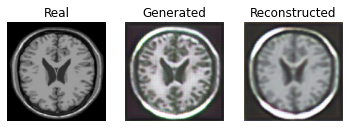

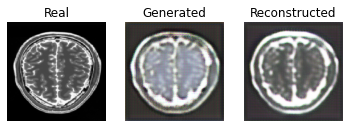

2


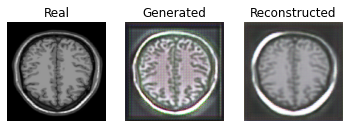

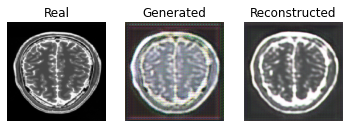

3


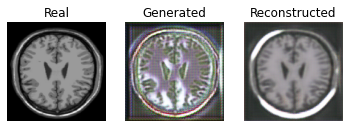

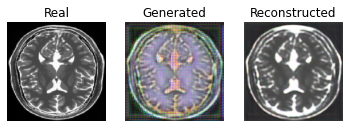

4


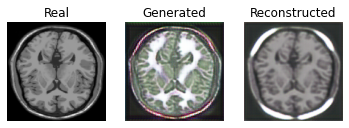

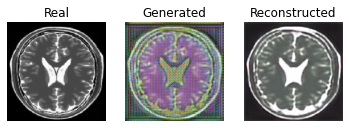

5


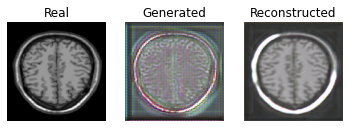

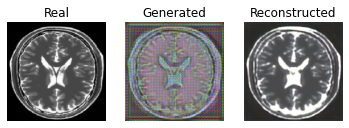

6


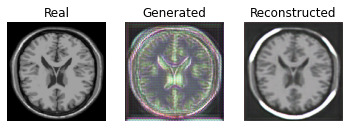

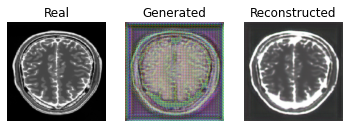

7


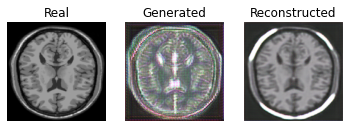

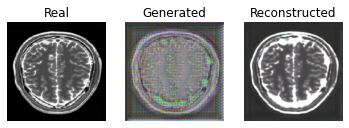

8


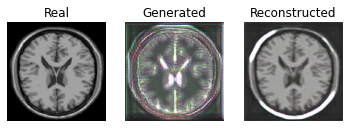

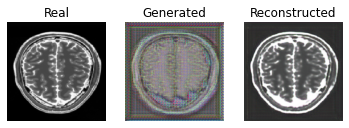

9


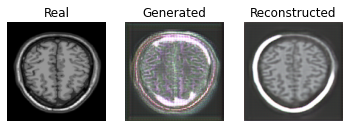

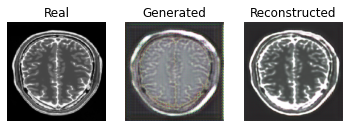

10


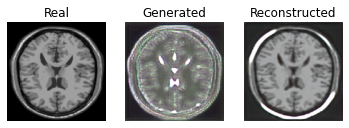

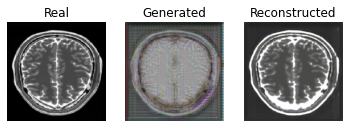

11


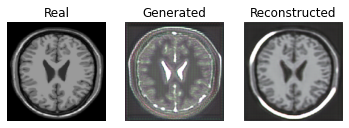

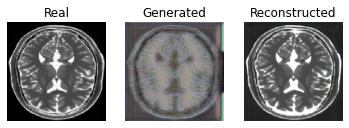

12


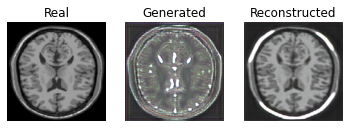

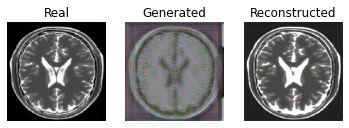

13


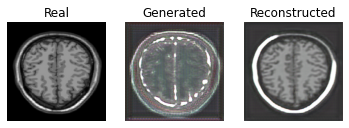

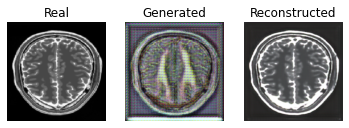

14


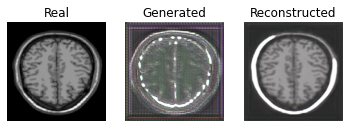

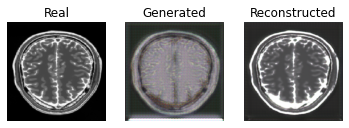

15


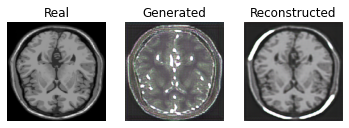

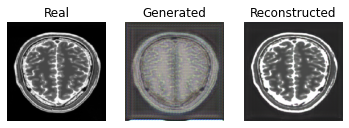

16


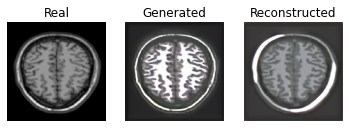

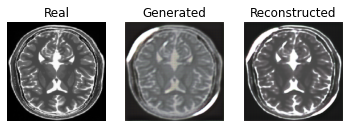

17


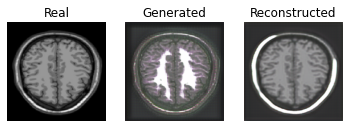

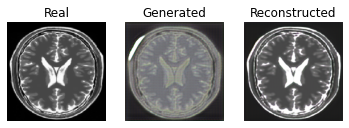

18


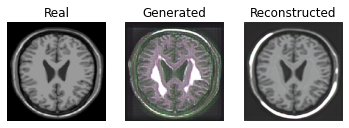

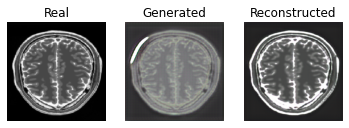

19


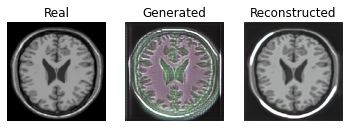

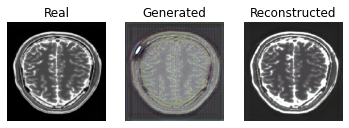

20


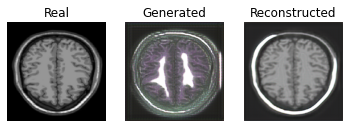

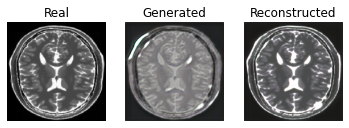

21


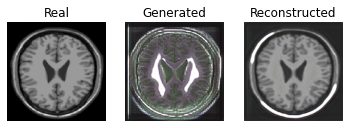

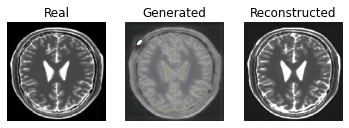

22


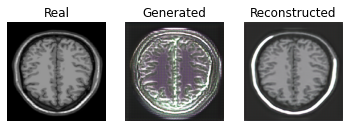

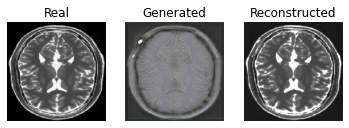

23


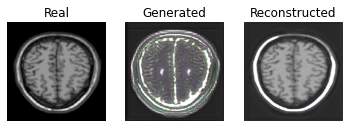

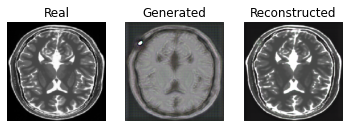

24


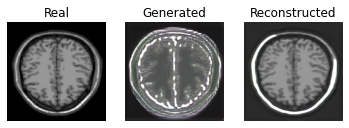

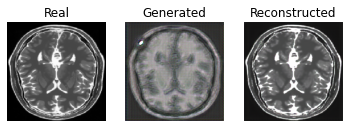

25


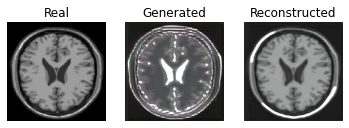

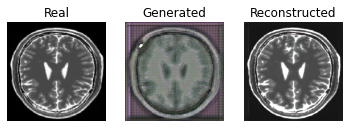

26


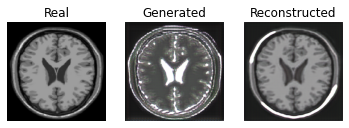

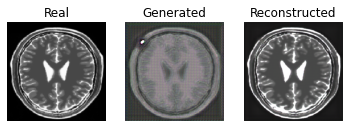

27


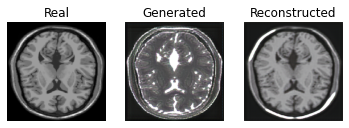

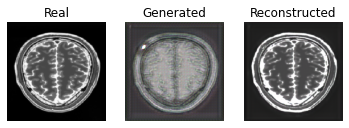

28


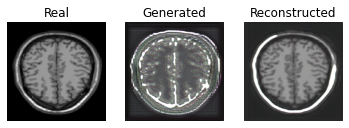

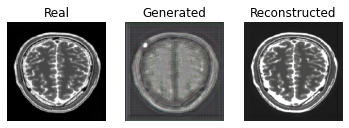

29


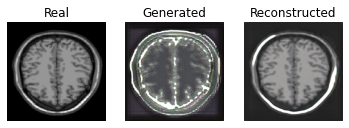

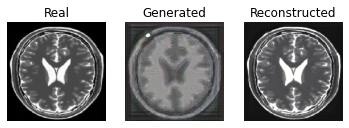

30


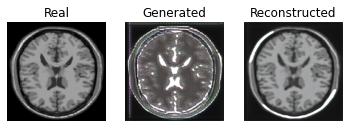

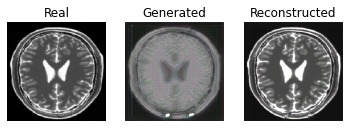

31


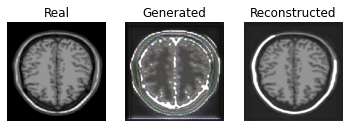

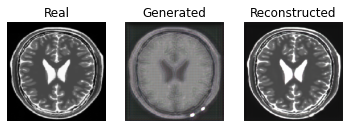

32


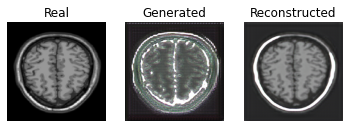

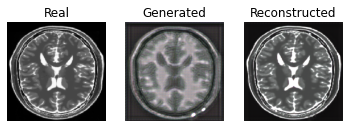

33


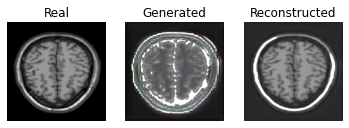

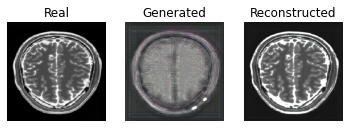

34


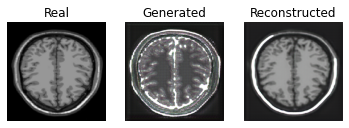

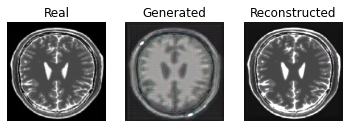

35


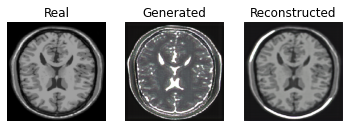

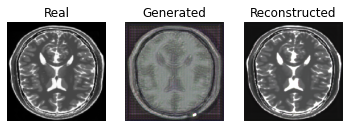

36


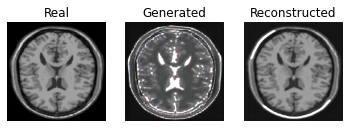

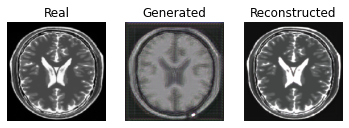

37


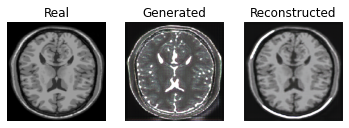

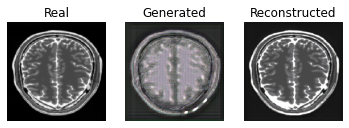

38


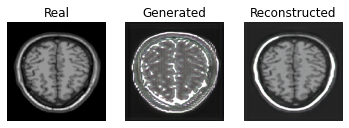

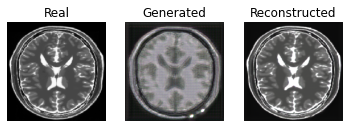

39


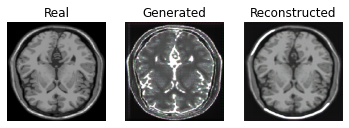

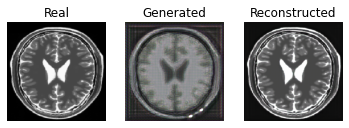

40


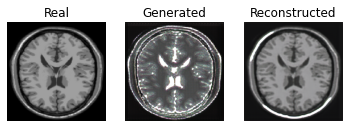

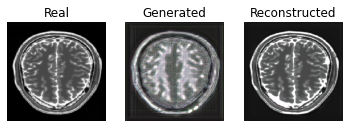

41


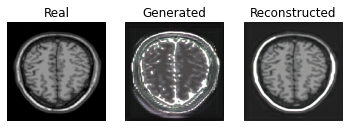

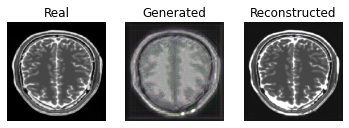

42


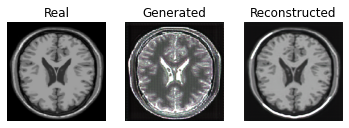

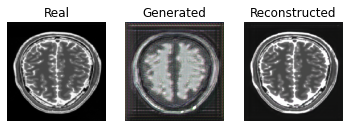

43


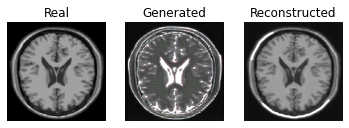

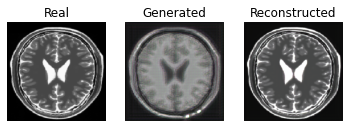

44


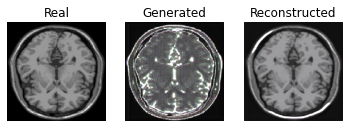

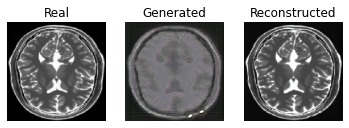

45


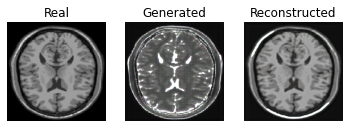

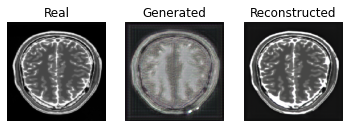

46


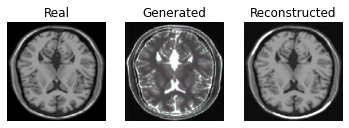

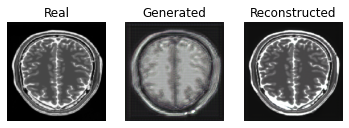

47


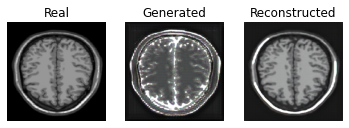

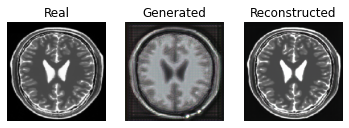

48


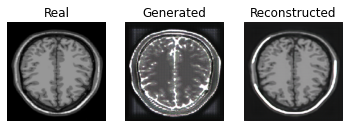

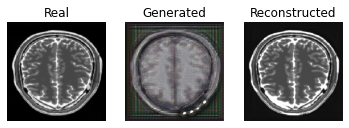

49


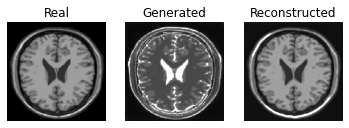

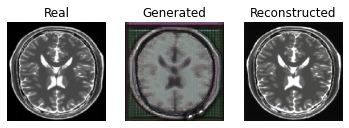

50


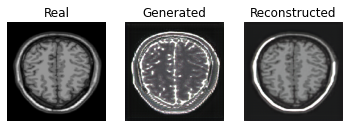

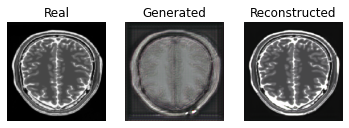

51


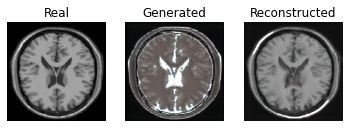

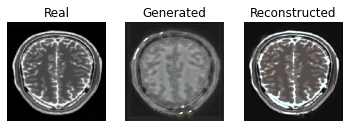

52


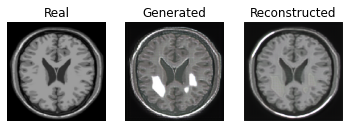

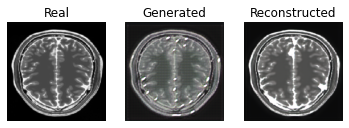

53


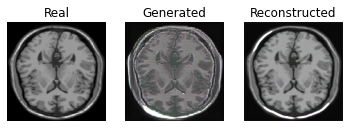

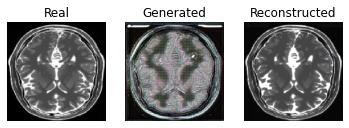

54


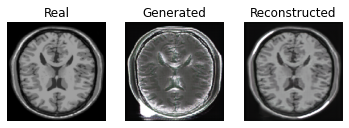

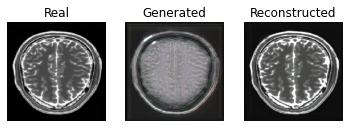

55


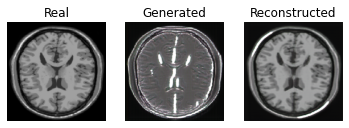

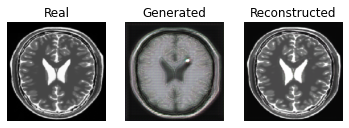

56


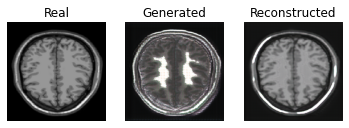

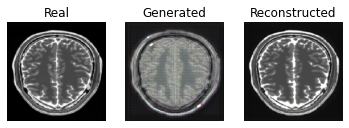

57


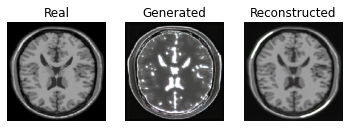

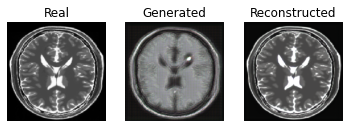

58


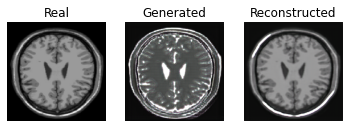

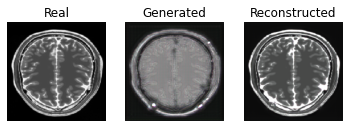

59


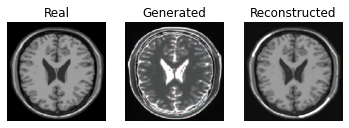

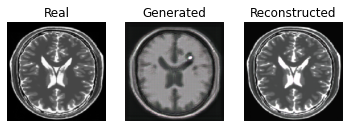

60


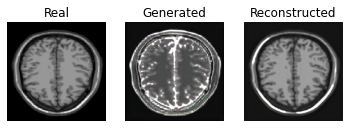

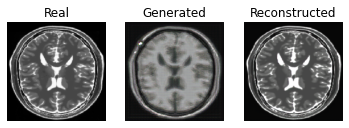

In [18]:
count=1 
for i in range(43,2581,43):
    print(count)
    plt_model(i)
    count+=1

****We can observe that after certain epochs (from 25), the T1w MRI was able to translate to T2w MRI.****